In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
# from lesson_functions import *
from sklearn.model_selection import train_test_split
from scipy.ndimage.measurements import label
# from lesson_functions import *
%matplotlib inline
# from features import *
# from parameters import *
# from windows import *

In [2]:
vehicle_images_gti_far=glob.glob('E:/Project/vehicles/GTI_Far/*.png')
vehicle_images_gti_left=glob.glob('E:/Project/vehicles/GTI_Left/*.png')
vehicle_images_gti_right=glob.glob('E:/Project/vehicles/GTI_Right/*.png')
vehicle_images_kitti=glob.glob('E:/Project/vehicles/KITTI_extracted/*.png')
vehicle_images_middle=glob.glob('E:/Project/vehicles/GTI_MiddleClose/*.png')

In [3]:
cars=vehicle_images_gti_far+vehicle_images_gti_left+vehicle_images_gti_right+vehicle_images_kitti+vehicle_images_middle

In [4]:
non_vehicle_images_extras=glob.glob('E:/Project/non_vehicles/Extras/*.png')
non_vehicle_images_gti=glob.glob('E:/Project/non_vehicles/GTI/*.png')

In [5]:
len(non_vehicle_images_extras)
len(non_vehicle_images_gti)

7214

In [6]:
notcars=non_vehicle_images_extras+non_vehicle_images_gti

In [7]:
len(notcars)

15637

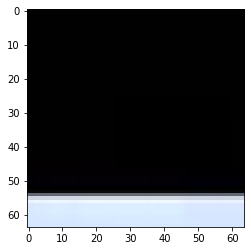

In [8]:
car_image=mpimg.imread(cars[310])
non_car_image=mpimg.imread(notcars[300])
plt.imshow(non_car_image)

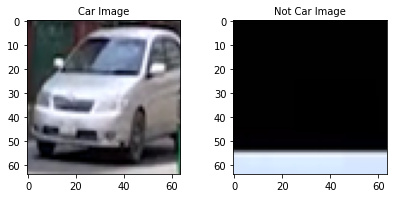

In [9]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(5, 5))
f.tight_layout()
ax1.imshow(car_image)
ax1.set_title('Car Image', fontsize=10)
ax2.imshow(non_car_image)
ax2.set_title('Not Car Image', fontsize=10)
plt.subplots_adjust(left=0.0, right=1.0, top=0.9, bottom=0.)
f.savefig('E:/Project/output_images/car_notcar.png')

# Extraction of different features

In [11]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualize=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualize=vis, feature_vector=feature_vec)
        return features

# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.concatenate((color1, color2, color3))


def color_hist(img, nbins=32):    #bins_range=(0, 256)
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features


def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
# 
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features
    

def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []

    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)for bbox in bboxes:
      
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
  
    return imcopy


# Hardcoded Parameters

In [12]:
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb

orient = 30  # HOG orientations
pix_per_cell = 16 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL'# Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = False # Spatial features on or off
hist_feat = False # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [None, None] # Min and max in y to search in slide_window()
n_frames=30
aspect_min,aspect_max = 0.7,3
min_bbox_area=40*40
min_close_area=80*80
close_y=500

# Window search on single_image features

In [13]:
def single_img_features(img, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=True, feature_vec=True)[0])
                hog_image=get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=True, feature_vec=True)[1]
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features),hog_image

# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 1), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=spatial_feat, 
                    hist_feat=hist_feat, hog_feat=hog_feat):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features ,hog_image= single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            plt.imshow(hog_image)
            plt.show()
            cv2.imwrite('E:/Project/output_images/HOG_example.png',hog_image)
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows
    

# Reduce the sample size because
# The quiz evaluator times out after 13s of CPU time


# Training SVM 

In [14]:
sample_size = 'ALL'
if sample_size!='ALL':
    cars = cars[0:sample_size]
    notcars = notcars[0:sample_size]

# color_space2 ='HSV'

car_features = extract_features(cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

# car_features2= extract_features(cars,color_space=color_space2,spatial_size=spatial_size,hist_bins=hist_bins,orient=orient,pix_per_cell=pix_per_cell,
#                               cell_per_block=cell_per_block,hog_channel=hog_channel,spatial_feat=True,hist_feat=True,hog_feat=False)

notcar_features = extract_features(notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

X = np.vstack((car_features,notcar_features,notcar_features,notcar_features,notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(4*len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
# svc = LinearSVC()
# # Check the training time for the SVC
# t=time.time()
# # svc.fit(X_train, y_train)
# t2 = time.time()
# print(round(t2-t, 2), 'Seconds to train SVC...')
# # Check the score of the SVC
# print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# # Check the prediction time for a single sample
# t=time.time()



Using: 30 orientations 16 pixels per cell and 2 cells per block
Feature vector length: 3240


In [15]:
# Use a linear SVC 
svc = LinearSVC()
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
e
t=time.time()


56.13 Seconds to train SVC...
Test Accuracy of SVC =  0.9983


C:\Users\USER\anaconda3\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


# Testing on test_images

In [19]:
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb

orient = 30  # HOG orientations
pix_per_cell = 16 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL'# Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = False # Spatial features on or off
hist_feat = False # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [None, None] # Min and max in y to search in slide_window()
n_frames=30
aspect_min,aspect_max = 0.7,3
min_bbox_area=50*50
min_close_area=80*80
close_y=500
close_x_thresh=450

In [20]:
test_images=glob.glob('E:/Project/test_images/test*.jpg')
test_images

['E:/Project/test_images\\test1.jpg',
 'E:/Project/test_images\\test2.jpg',
 'E:/Project/test_images\\test3.jpg',
 'E:/Project/test_images\\test4.jpg',
 'E:/Project/test_images\\test5.jpg',
 'E:/Project/test_images\\test6.jpg']

<ipython-input-11-754bc53a3816>:121: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
<ipython-input-11-754bc53a3816>:122: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Dep

52


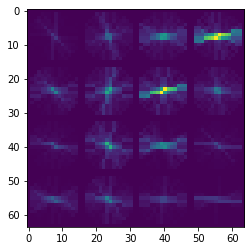

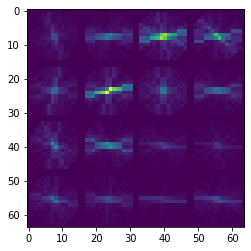

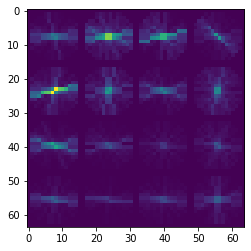

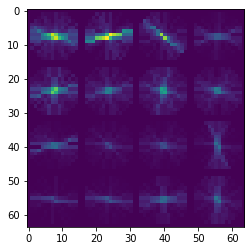

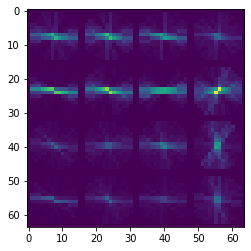

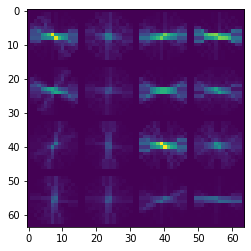

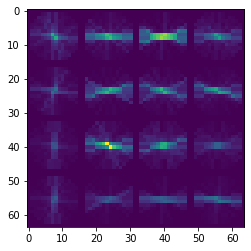

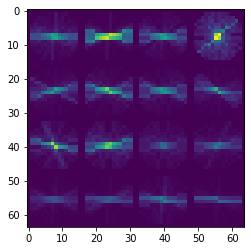

<ipython-input-24-80b40456f0da>:36: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  heat=np.zeros_like(image[:,:,0]).astype(np.float)


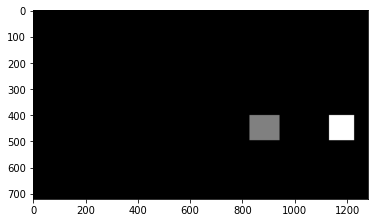

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
<ipython-input-11-754bc53a3816>:121: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
<ipython-input-11-754bc53a3816>:122: DeprecationWarning: `np.int` is a deprecate

52


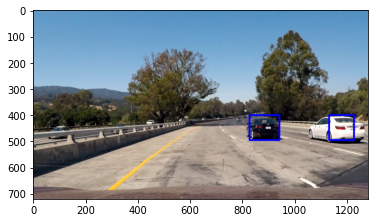

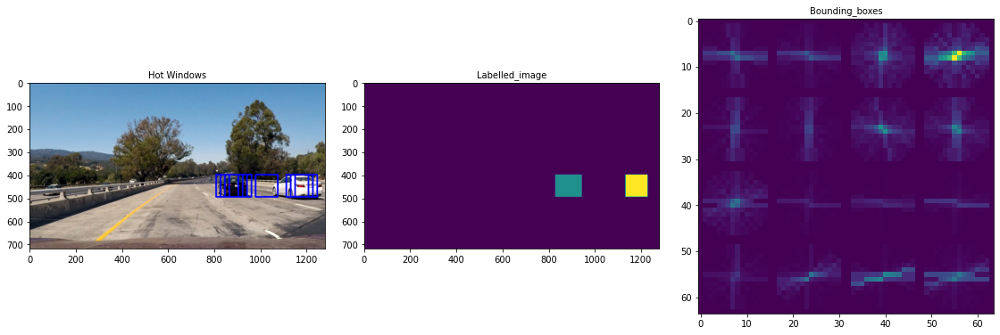

<ipython-input-24-80b40456f0da>:36: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  heat=np.zeros_like(image[:,:,0]).astype(np.float)


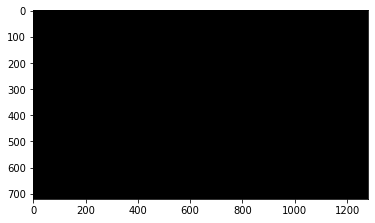

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
<ipython-input-11-754bc53a3816>:121: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
<ipython-input-11-754bc53a3816>:122: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the 

52


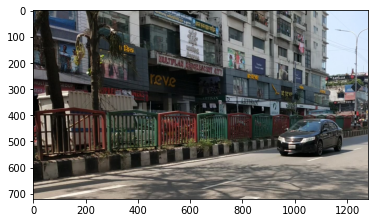

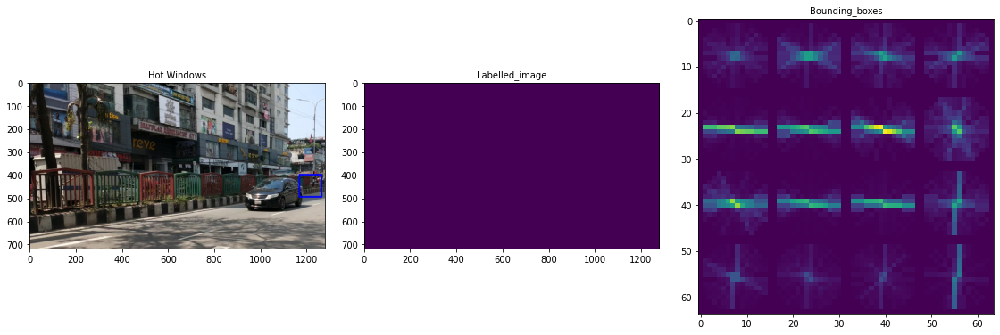

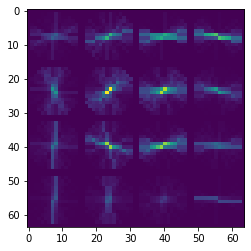

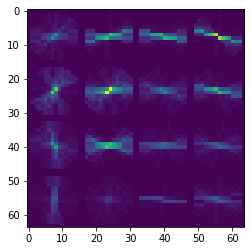

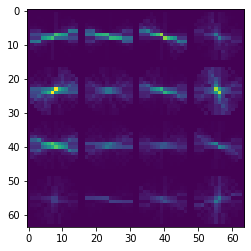

...

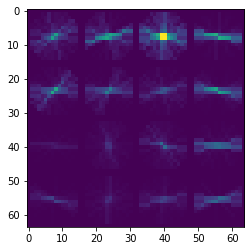

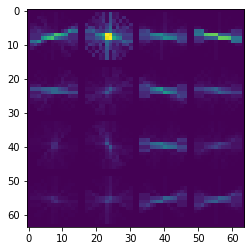

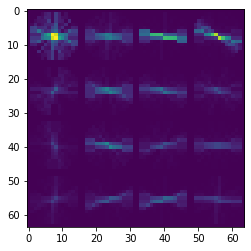

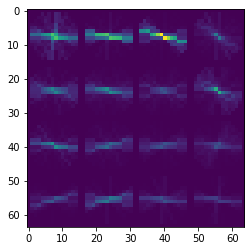

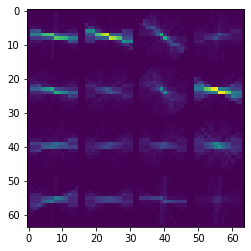

<ipython-input-24-80b40456f0da>:36: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  heat=np.zeros_like(image[:,:,0]).astype(np.float)


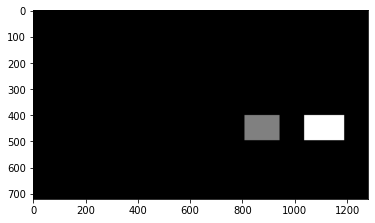

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
<ipython-input-11-754bc53a3816>:121: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
<ipython-input-11-754bc53a3816>:122: DeprecationWarning: `np.int` is a deprecate

52


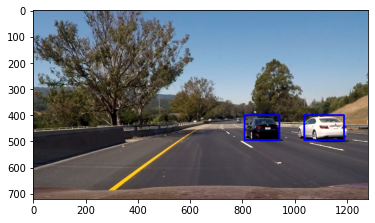

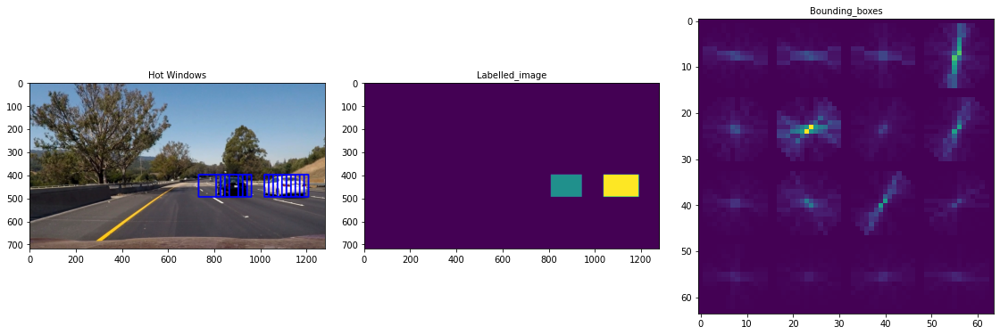

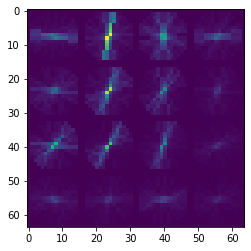

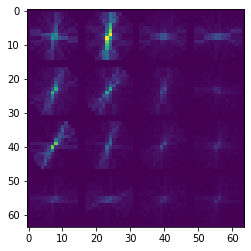

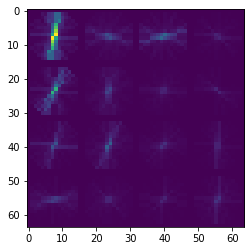

<ipython-input-24-80b40456f0da>:36: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  heat=np.zeros_like(image[:,:,0]).astype(np.float)


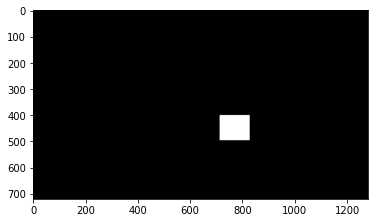

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
<ipython-input-11-754bc53a3816>:121: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
<ipython-input-11-754bc53a3816>:122: DeprecationWarning: `np.int` is a deprecate

52


<ipython-input-24-80b40456f0da>:36: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  heat=np.zeros_like(image[:,:,0]).astype(np.float)


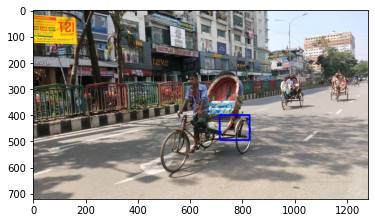

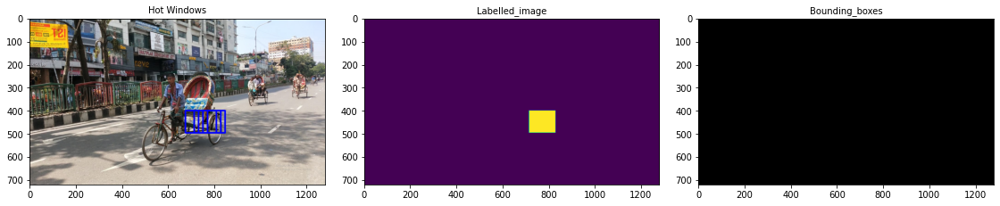

<ipython-input-11-754bc53a3816>:121: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
<ipython-input-11-754bc53a3816>:122: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Dep

52


<ipython-input-24-80b40456f0da>:36: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  heat=np.zeros_like(image[:,:,0]).astype(np.float)


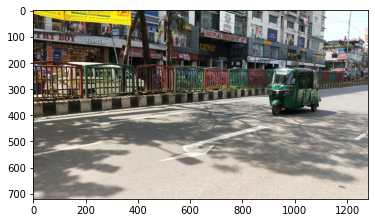

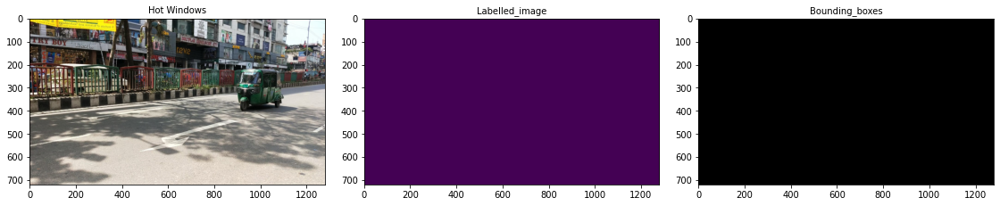

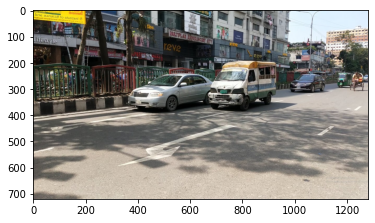

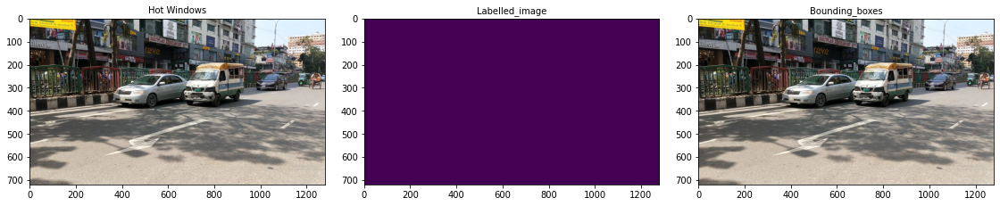

In [24]:
for images in test_images:
    
    image = cv2.imread(images)
    image=cv2.resize(image,(1280,720))
    image = image.astype(np.float32)/255
    image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    draw_image = np.copy(image)
    draw_image1 = np.copy(image)

    # Uncomment the following line if you extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # image you are searching is a .jpg (scaled 0 to 255)
    #image = image.astype(np.float32)/255

    windows_small = slide_window(image, x_start_stop=[200, 1280], y_start_stop=[400,500], 
                        xy_window=(96, 96), xy_overlap=(0.8, 0.8))

    windows_medium = slide_window(image,x_start_stop=[0,1280],y_start_stop=[350,550],
                                  xy_window=(128,128),xy_overlap=(0.7,0.7))
    # windows_small_small=slide_window(image,x_start_stop=[200,1280],y_start_stop=[300,680],xy_window=(32,32),xy_overlap=(0.2,0.2))
    # windows_medium = slide_window(image,x_start_stop=[200,1280],y_start_stop=[200,680],xy_window=(128,128),xy_overlap=(0.5,0.5))
    # windows_large = slide_window(image,x_start_stop=[200,1280],y_start_stop=[400,680],xy_window=(200,200),xy_overlap=(0.6,0.6))

    windows=windows_small
    print(len(windows_small))
    # print(len(windows_medium))

    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)   
    
    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)
    heat=np.zeros_like(image[:,:,0]).astype(np.float)
    heat_image=add_heat(heat,hot_windows)
    heat_image_thresh=apply_threshold(heat_image,2)
    heatmap=np.clip(heat_image,0,255)

    labels=label(heatmap)
    plt.imshow(labels[0],cmap='gray')
    plt.show()
    result=draw_labeled_bboxes(draw_image,labels)
    plt.imshow(result)
    f, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize=(15, 15))
    f.tight_layout()
    ax1.imshow(window_img)
    ax1.set_title('Hot Windows', fontsize=10)
    ax2.imshow(labels[0])
    ax2.set_title('Labelled_image', fontsize=10)
    ax3.imshow(result)
    ax3.set_title('Bounding_boxes', fontsize=10)
    plt.subplots_adjust(left=0.0, right=1.0, top=0.9, bottom=0.)
   # f.savefig('E:/Project/output_images/'+images.split("/")[-1])

In [25]:
svc

LinearSVC()

# Detection for Videos

In [22]:
class Hot_window():
    def __init__(self,n):
#         print('a')
        self.n=n
        self.windows=[]
    
    def add_windows(self,new_windows):
        self.windows.append(new_windows)
        q_full=len(self.windows)>=self.n
        if q_full:
            _ = self.windows.pop(0)
    
    def get_windows(self):
        output_windows=[]
        
        for window in self.windows:
            output_windows.append(window)
        return output_windows

# Heat map generation

In [26]:
def add_heat(heatmap,bbox_list):
    for box in bbox_list:
#         print(box)
        heatmap[box[0][1]:box[1][1],box[0][0]:box[1][0]]+=1
    return heatmap

def apply_threshold(heatmap,threshold):
    heatmap[heatmap<threshold]=0
    return heatmap

def find_cars(img,xstart,xstop, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, cells_jump,spatial_size, hist_bins,spatial_feat,hist_feat):
    
    global count
    if count==0:
        print(img.shape)
    
    if (img.shape!=(1280,720)):
        img=cv2.resize(img,(1280,720))
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
#     nblocks_per_window_copy=int(nblocks_per_window)
    if count==0:
        count=count+1
        print(nblocks_per_window)
#         print(nbocks_per_window_copy)
        print(count)
#     cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_jump
    nysteps = (nyblocks - nblocks_per_window) // cells_jump
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    bbox=[]
    for xb in range(np.int(nxsteps)):
        for yb in range(np.int(nysteps)):
            ypos = yb*cells_jump
            xpos = xb*cells_jump
            # Extract HOG for this patch
            hog_feat1 = hog1[np.int(ypos):int(ypos+nblocks_per_window), int(xpos):int(xpos+nblocks_per_window)].ravel() 
            hog_feat2 = hog2[np.int(ypos):int(ypos+nblocks_per_window), int(xpos):int(xpos+nblocks_per_window)].ravel() 
            hog_feat3 = hog3[np.int(ypos):int(ypos+nblocks_per_window), int(xpos):int(xpos+nblocks_per_window)].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[int(ytop):int(ytop+window), int(xleft):int(xleft+window)], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
#             print(test_prediction)
            if test_prediction==1:
#                 print(test_prediction)
                xbox_left=np.int(xleft*scale)
                ybox_top=np.int(ytop*scale)
                win_draw=np.int(window*scale)
                bbox.append(((int(xbox_left+xstart),int(ybox_top+ystart)),(int(xbox_left+win_draw+xstart),int(ybox_top+win_draw+ystart))))
    
    return bbox

def draw_labeled_bboxes(img,labels):
    for car_number in range(1,labels[1]+1):
        nonzero=(labels[0]==car_number).nonzero()
        
        nonzeroy=np.array(nonzero[0])
        nonzerox=np.array(nonzero[1])
        
        bbox=((np.min(nonzerox),np.min(nonzeroy)),(np.max(nonzerox),np.max(nonzeroy)))
        bbox_w=(bbox[1][0]-bbox[0][0])
        bbox_h=(bbox[1][1]-bbox[0][1])
        
        aspect_ratio=bbox_w/bbox_h
        
        bbox_area=bbox_w*bbox_h
        if bbox_area<min_close_area and bbox[0][1]>close_y:
            small_box_close=True
        else:
            small_box_close=False
            
        if bbox[0][0]<close_x_thresh:
            close_x=True
        else: close_x=False
        
#         cv2.rectangle(img,bbox[0],bbox[1],(0,0,255),6)
        if aspect_ratio>aspect_min and aspect_ratio<aspect_max and not small_box_close and bbox_area>min_bbox_area and not close_x:
#             print("Got a frame")
            cv2.rectangle(img,bbox[0],bbox[1],(0,0,255),6)
#             plt.imshow(img)
#             plt.show()
    return img

In [27]:
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb

orient = 30  # HOG orientations
pix_per_cell = 16 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL'# Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = False # Spatial features on or off
hist_feat = False # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [None, None] # Min and max in y to search in slide_window()
n_frames=30
aspect_min,aspect_max = 0.7,3
min_bbox_area=50*50
min_close_area=80*80
close_y=500
close_x_thresh=430

In [28]:
def pipeline(image):
    global hot_window
    draw_image=np.copy(image)
    image=image.astype(np.float32)/255
    image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
#     hot_window.add_windows(image)
#     if(len(hot_window.windows)<n_frames):
#         return draw_image
    
    windows_small = slide_window(image, x_start_stop=[100,1280], y_start_stop=[400,550], 
                    xy_window=(96, 96), xy_overlap=(0.7, 0.7))
#     windows_medium = slide_window(image,x_start_stop=[200,1280],y_start_stop=[350,550],
#                               xy_window=(128,128),xy_overlap=(0.7,0.7))
    windows=windows_small
    
#     hot_windows=[]
    frames=hot_window.get_windows()
    if len(frames)<n_frames-1:
        hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)  
#         print("a")
        
#         hot_windows.append(find_cars(image,400,1280,400, 600, 1.5, svc, X_scaler, orient, pix_per_cell,
#                                      cell_per_block,2,spatial_size, hist_bins,False,True))
#         hot_windows.append(find_cars(image,400,1280,350,600, 2, svc, X_scaler, orient, pix_per_cell,
#                                       cell_per_block,2,spatial_size, hist_bins,False,True))
#         print(len(hot_windows[0]))
        if(len(hot_windows)>0):
#             print('a')
            hot_window.add_windows(hot_windows)
    
        return image
    
    else:
        hot_windows=search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)  
#         print("b")
        
#         hot_windows.append(find_cars(image,400,1280,400, 550, 1.5, svc, X_scaler, orient, pix_per_cell,
#                                      cell_per_block,2, spatial_size, hist_bins,spatial_feat=False,hist_feat=True))
#         hot_windows.append(find_cars(image,400,1280,350, 550, 2, svc, X_scaler, orient, pix_per_cell,
#                                       cell_per_block,2,spatial_size, hist_bins,spatial_feat=False,hist_feat=True))
#         hot_window.add_windows(np.concatenate(hot_windows))

        if(len(hot_windows)>0):
            hot_window.add_windows(hot_windows)
#         hot_window.add_windows(hot_windows)
            
    hot_windows=hot_window.get_windows()
#     print(len(hot_windows))
        
        
#     hot_windows=[]
#     for frame in frames:
#         hot_windows.append(find_cars(frame,400,1280,350, 550, 1, svc, X_scaler, orient, pix_per_cell,
#                                      cell_per_block, spatial_size, hist_bins,hist_feat,spatial_feat,window=100))
        
#         hot_windows.append(find_cars(frame,400, 600, 1, svc, X_scaler, orient, pix_per_cell,
#                                      cell_per_block, spatial_size, hist_bins))
#         hot_windows.append(search_windows(frame,windows,svc, X_scaler, color_space=color_space, 
#                         spatial_size=spatial_size, hist_bins=hist_bins, 
#                         orient=orient, pix_per_cell=pix_per_cell, 
#                         cell_per_block=cell_per_block, 
#                         hog_channel=hog_channel, spatial_feat=spatial_feat, 
#                         hist_feat=hist_feat, hog_feat=hog_feat))
    
    heat=np.zeros_like(image[:,:,0]).astype(np.float)

            
    hot_windows=np.concatenate(hot_windows)
#     print(hot_windows)
    heat_image=add_heat(heat,hot_windows)
    heat_image_thresh=apply_threshold(heat_image,33)
    heatmap=np.clip(heat_image,0,255)
    
    labels=label(heatmap)
#     plt.imshow(labels[0],cmap='gray')
#     plt.show()
    result=draw_labeled_bboxes(draw_image,labels)
#     plt.imshow(result)
#     plt.show()
    return result

In [29]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

Moviepy - Building video E:/Project/result_videos/outputfinal.mp4.
Moviepy - Writing video E:/Project/result_videos/outputfinal.mp4



t:   6%|███▊                                                              | 47/804 [04:52<1:18:57,  6.26s/it, now=None]

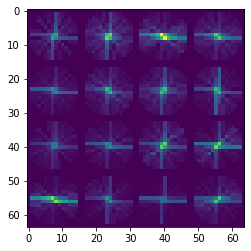

t:   8%|█████▎                                                            | 65/804 [06:43<1:15:14,  6.11s/it, now=None]

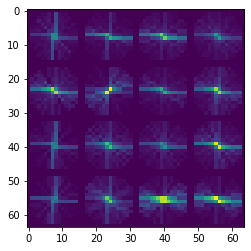

t:   9%|█████▋                                                            | 70/804 [07:13<1:14:48,  6.12s/it, now=None]

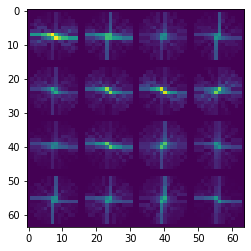

t:   9%|█████▊                                                            | 71/804 [07:20<1:15:25,  6.17s/it, now=None]

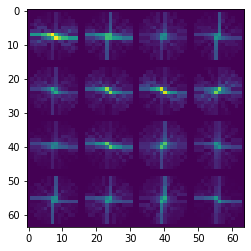

t:   9%|█████▉                                                            | 72/804 [07:26<1:15:54,  6.22s/it, now=None]

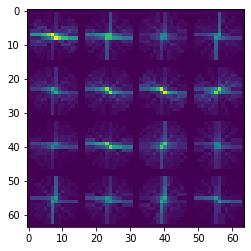

t:  12%|███████▉                                                          | 96/804 [09:57<1:16:41,  6.50s/it, now=None]

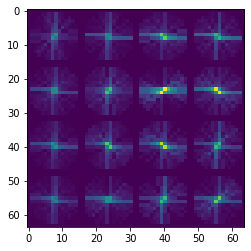

t:  13%|████████▌                                                        | 106/804 [11:02<1:13:46,  6.34s/it, now=None]

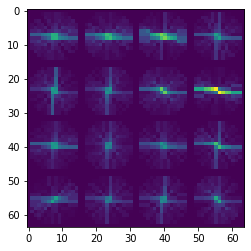

t:  13%|████████▋                                                        | 107/804 [11:08<1:13:43,  6.35s/it, now=None]

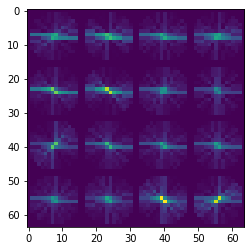

t:  14%|████████▊                                                        | 109/804 [11:21<1:13:24,  6.34s/it, now=None]

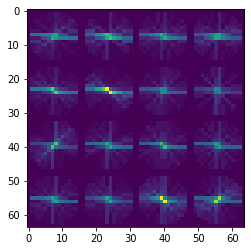

t:  14%|████████▉                                                        | 110/804 [11:27<1:13:32,  6.36s/it, now=None]

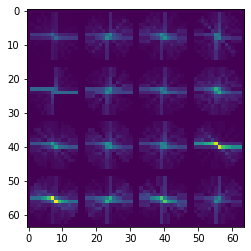

t:  14%|████████▉                                                        | 111/804 [11:34<1:13:44,  6.38s/it, now=None]

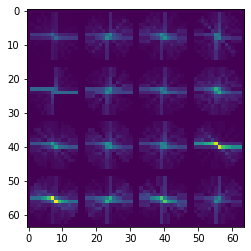

t:  14%|█████████                                                        | 112/804 [11:40<1:13:57,  6.41s/it, now=None]

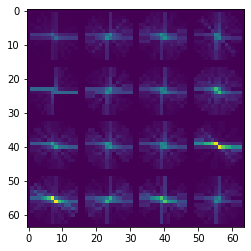

t:  14%|█████████▏                                                       | 113/804 [11:47<1:13:59,  6.43s/it, now=None]

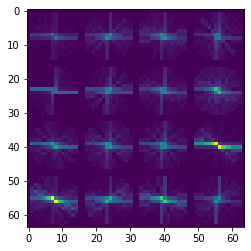

t:  14%|█████████▍                                                       | 116/804 [12:06<1:11:54,  6.27s/it, now=None]

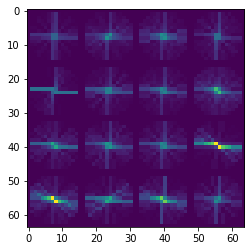

t:  15%|█████████▋                                                       | 120/804 [12:30<1:09:51,  6.13s/it, now=None]

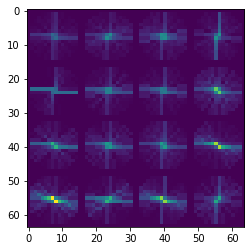

t:  15%|█████████▊                                                       | 121/804 [12:36<1:09:41,  6.12s/it, now=None]

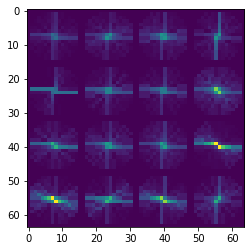

t:  15%|█████████▊                                                       | 122/804 [12:42<1:10:07,  6.17s/it, now=None]

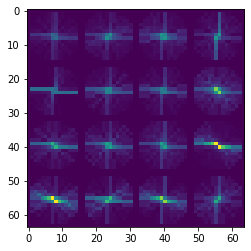

t:  15%|█████████▉                                                       | 123/804 [12:49<1:10:45,  6.23s/it, now=None]

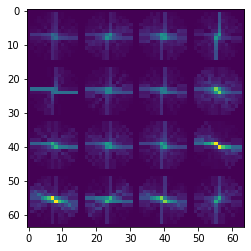

t:  15%|██████████                                                       | 124/804 [12:55<1:11:33,  6.31s/it, now=None]

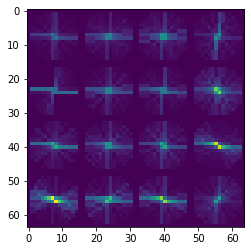

t:  16%|██████████                                                       | 125/804 [13:02<1:11:15,  6.30s/it, now=None]

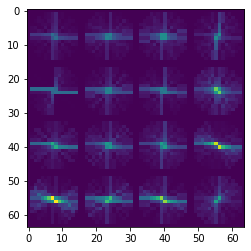

t:  16%|██████████▏                                                      | 126/804 [13:08<1:11:17,  6.31s/it, now=None]

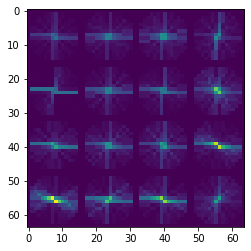

t:  16%|██████████▎                                                      | 128/804 [13:20<1:10:39,  6.27s/it, now=None]

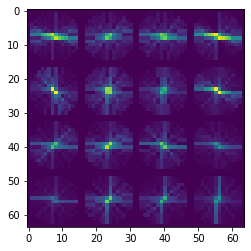

t:  16%|██████████▋                                                      | 132/804 [13:46<1:11:06,  6.35s/it, now=None]

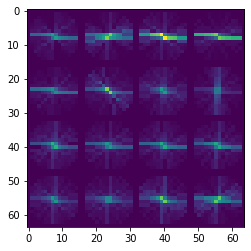

t:  17%|██████████▊                                                      | 133/804 [13:52<1:10:36,  6.31s/it, now=None]

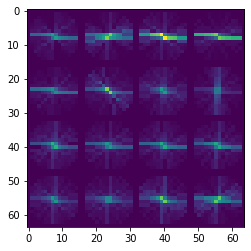

t:  17%|██████████▊                                                      | 134/804 [13:58<1:10:27,  6.31s/it, now=None]

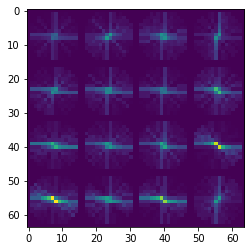

t:  17%|██████████▉                                                      | 135/804 [14:05<1:10:50,  6.35s/it, now=None]

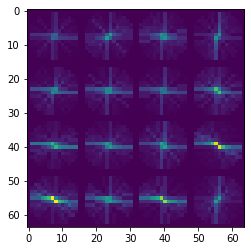

t:  17%|██████████▉                                                      | 136/804 [14:11<1:11:07,  6.39s/it, now=None]

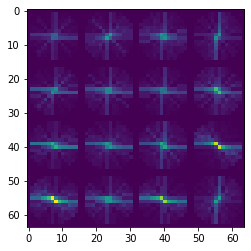

t:  17%|███████████                                                      | 137/804 [14:19<1:14:18,  6.68s/it, now=None]

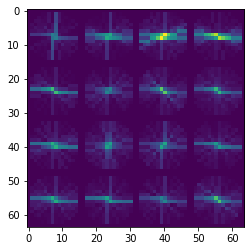

t:  17%|███████████▏                                                     | 138/804 [14:25<1:12:52,  6.57s/it, now=None]

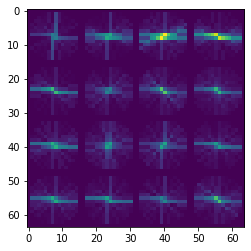

t:  17%|███████████▏                                                     | 139/804 [14:31<1:11:48,  6.48s/it, now=None]

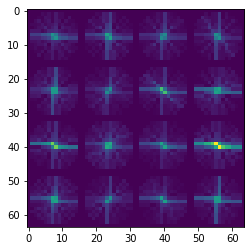

t:  18%|███████████▌                                                     | 143/804 [14:56<1:09:20,  6.29s/it, now=None]

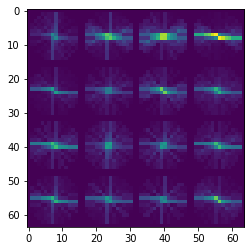

t:  19%|████████████▏                                                    | 150/804 [15:40<1:08:34,  6.29s/it, now=None]

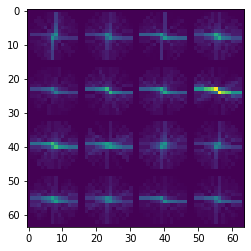

t:  19%|████████████▏                                                    | 151/804 [15:47<1:09:02,  6.34s/it, now=None]

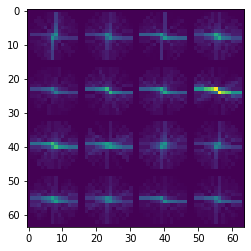

t:  19%|████████████▎                                                    | 152/804 [15:53<1:09:26,  6.39s/it, now=None]

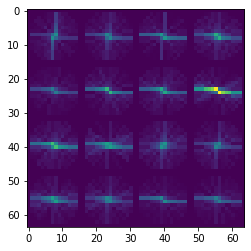

t:  19%|████████████▎                                                    | 153/804 [16:00<1:09:33,  6.41s/it, now=None]

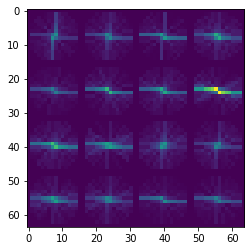

t:  22%|██████████████▏                                                  | 176/804 [18:29<1:06:54,  6.39s/it, now=None]

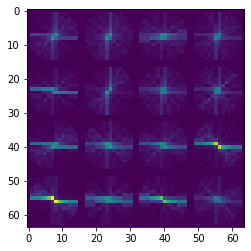

t:  23%|██████████████▉                                                  | 184/804 [19:20<1:06:11,  6.41s/it, now=None]

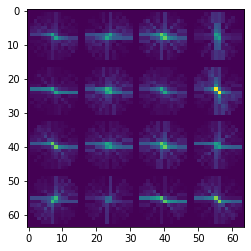

t:  23%|███████████████                                                  | 187/804 [19:40<1:06:07,  6.43s/it, now=None]

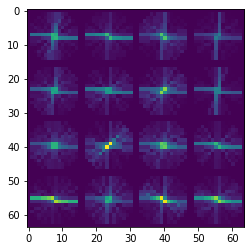

t:  23%|███████████████▏                                                 | 188/804 [19:46<1:06:42,  6.50s/it, now=None]

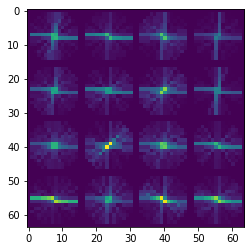

t:  24%|███████████████▎                                                 | 189/804 [19:53<1:06:50,  6.52s/it, now=None]

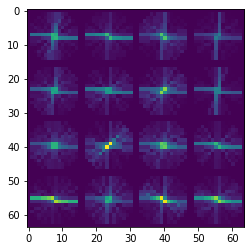

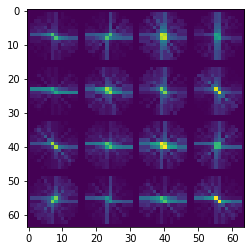

t:  25%|███████████████▉                                                 | 197/804 [20:44<1:04:27,  6.37s/it, now=None]

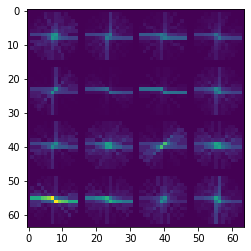

t:  25%|████████████████                                                 | 198/804 [20:50<1:04:33,  6.39s/it, now=None]

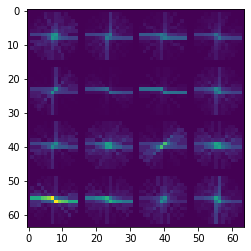

t:  25%|████████████████                                                 | 199/804 [20:57<1:05:58,  6.54s/it, now=None]

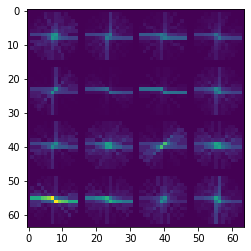

t:  25%|████████████████▏                                                | 200/804 [21:04<1:07:07,  6.67s/it, now=None]

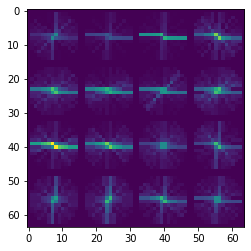

t:  25%|████████████████▎                                                | 201/804 [21:13<1:12:02,  7.17s/it, now=None]

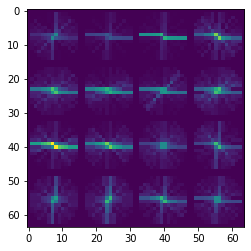

t:  25%|████████████████▎                                                | 202/804 [21:20<1:12:31,  7.23s/it, now=None]

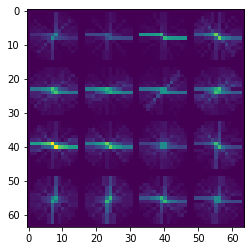

t:  25%|████████████████▍                                                | 203/804 [21:27<1:12:20,  7.22s/it, now=None]

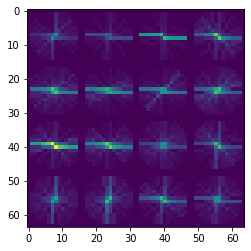

t:  25%|████████████████▍                                                | 204/804 [21:34<1:10:57,  7.10s/it, now=None]

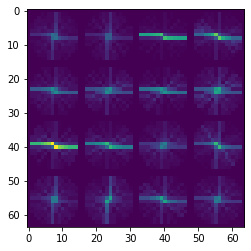

t:  25%|████████████████▌                                                | 205/804 [21:41<1:10:03,  7.02s/it, now=None]

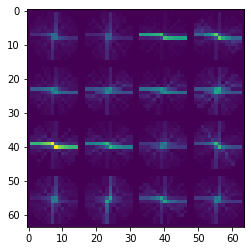

t:  26%|████████████████▋                                                | 206/804 [21:48<1:09:15,  6.95s/it, now=None]

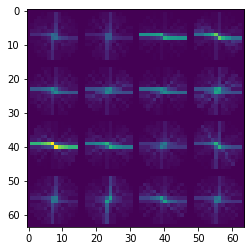

t:  28%|█████████████████▉                                               | 222/804 [23:34<1:04:54,  6.69s/it, now=None]

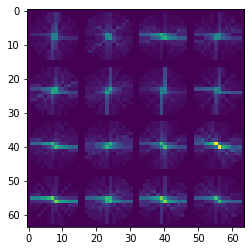

t:  28%|██████████████████                                               | 223/804 [23:41<1:05:28,  6.76s/it, now=None]

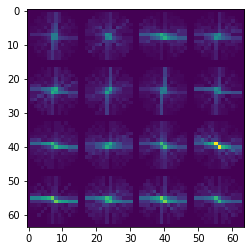

t:  29%|██████████████████▉                                              | 234/804 [24:52<1:00:44,  6.39s/it, now=None]

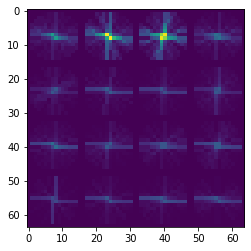

t:  29%|██████████████████▉                                              | 235/804 [24:59<1:01:12,  6.45s/it, now=None]

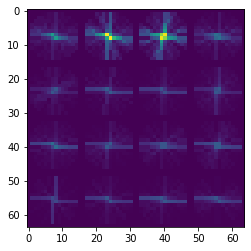

t:  29%|███████████████████                                              | 236/804 [25:05<1:01:27,  6.49s/it, now=None]

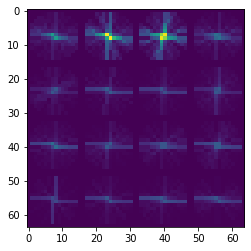

t:  31%|████████████████████▌                                              | 246/804 [26:10<59:55,  6.44s/it, now=None]

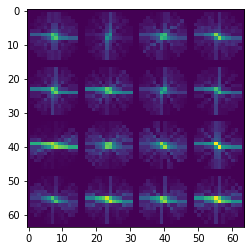

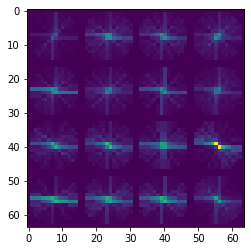

t:  31%|███████████████████▉                                             | 247/804 [26:17<1:00:57,  6.57s/it, now=None]

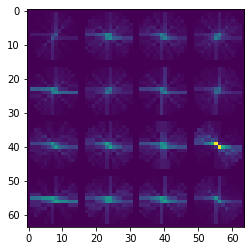

t:  31%|████████████████████                                             | 248/804 [26:24<1:01:10,  6.60s/it, now=None]

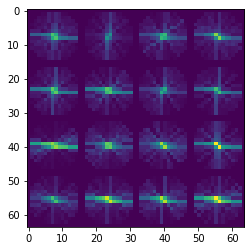

t:  31%|████████████████████▏                                            | 249/804 [26:31<1:01:30,  6.65s/it, now=None]

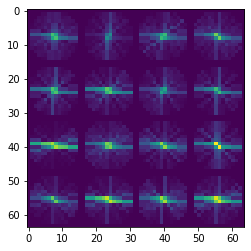

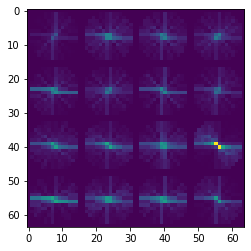

t:  31%|████████████████████▏                                            | 250/804 [26:38<1:02:14,  6.74s/it, now=None]

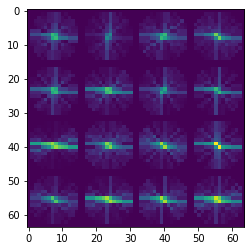

t:  32%|█████████████████████                                            | 260/804 [27:45<1:02:24,  6.88s/it, now=None]

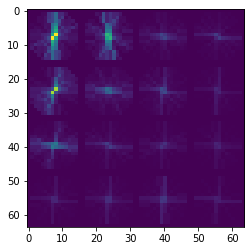

t:  32%|█████████████████████                                            | 261/804 [27:53<1:03:59,  7.07s/it, now=None]

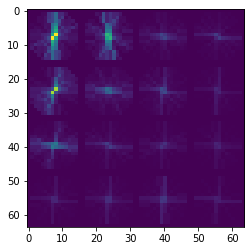

t:  33%|█████████████████████▏                                           | 262/804 [28:00<1:03:21,  7.01s/it, now=None]

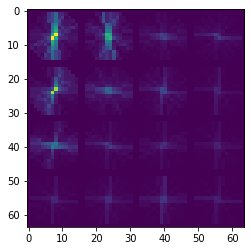

t:  33%|█████████████████████▎                                           | 263/804 [28:07<1:02:46,  6.96s/it, now=None]

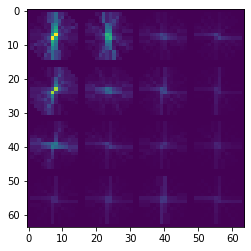

t:  33%|█████████████████████▎                                           | 264/804 [28:13<1:02:10,  6.91s/it, now=None]

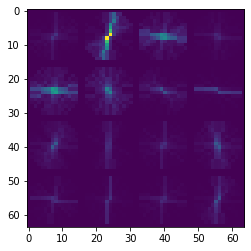

t:  33%|█████████████████████▍                                           | 265/804 [28:20<1:01:48,  6.88s/it, now=None]

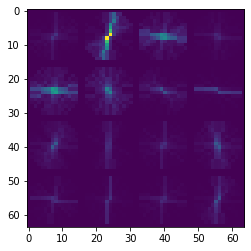

t:  33%|█████████████████████▌                                           | 266/804 [28:27<1:01:36,  6.87s/it, now=None]

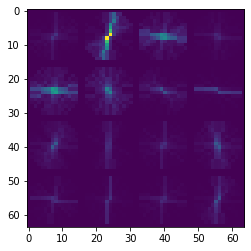

t:  34%|██████████████████████▌                                            | 270/804 [28:54<59:46,  6.72s/it, now=None]

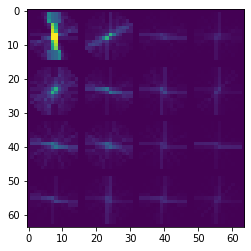

t:  34%|██████████████████████▌                                            | 271/804 [29:00<59:49,  6.73s/it, now=None]

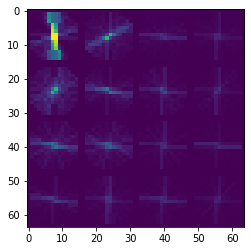

t:  34%|██████████████████████▋                                            | 272/804 [29:07<59:45,  6.74s/it, now=None]

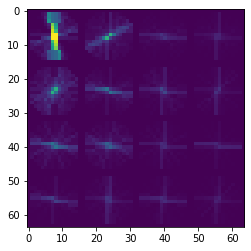

t:  34%|██████████████████████▊                                            | 273/804 [29:14<59:48,  6.76s/it, now=None]

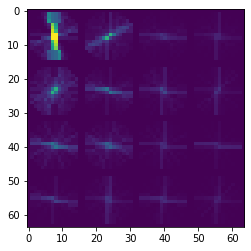

t:  34%|██████████████████████▊                                            | 274/804 [29:21<59:31,  6.74s/it, now=None]

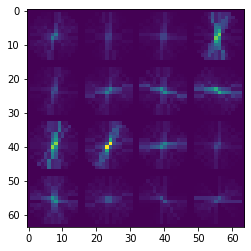

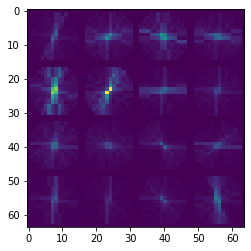

t:  34%|██████████████████████▏                                          | 275/804 [29:28<1:00:00,  6.81s/it, now=None]

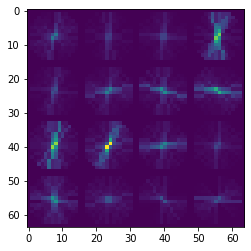

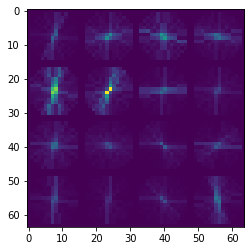

t:  34%|███████████████████████                                            | 276/804 [29:34<59:46,  6.79s/it, now=None]

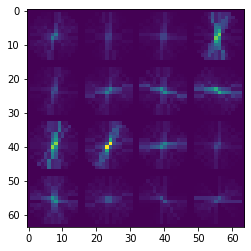

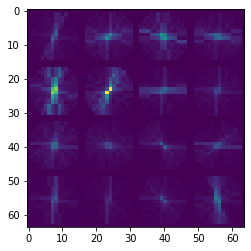

t:  34%|███████████████████████                                            | 277/804 [29:41<59:41,  6.80s/it, now=None]

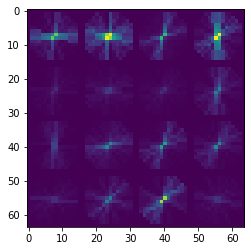

t:  35%|███████████████████████▏                                           | 278/804 [29:48<59:29,  6.79s/it, now=None]

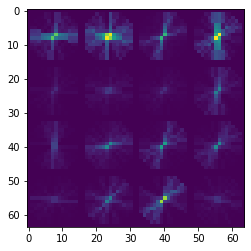

t:  35%|███████████████████████▎                                           | 279/804 [29:55<59:20,  6.78s/it, now=None]

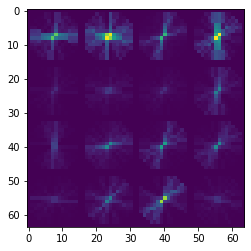

t:  35%|███████████████████████▎                                           | 280/804 [30:02<59:47,  6.85s/it, now=None]

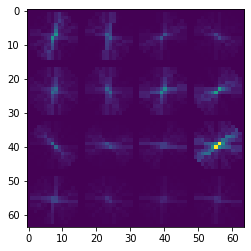

t:  35%|███████████████████████▍                                           | 281/804 [30:09<59:34,  6.84s/it, now=None]

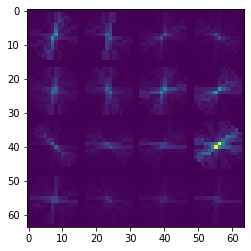

t:  35%|███████████████████████▌                                           | 283/804 [30:22<59:09,  6.81s/it, now=None]

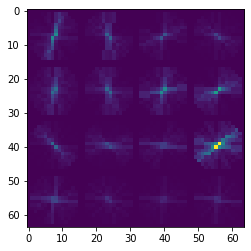

t:  35%|███████████████████████▋                                           | 284/804 [30:29<59:09,  6.83s/it, now=None]

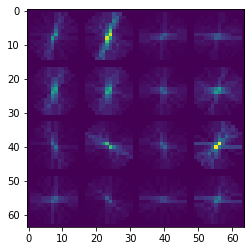

t:  35%|███████████████████████▊                                           | 285/804 [30:36<59:36,  6.89s/it, now=None]

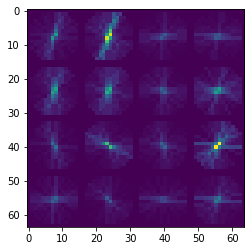

t:  36%|███████████████████████▊                                           | 286/804 [30:43<59:09,  6.85s/it, now=None]

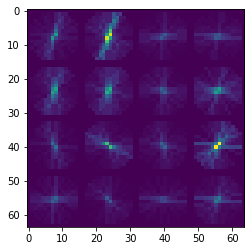

t:  36%|███████████████████████▉                                           | 287/804 [30:50<59:25,  6.90s/it, now=None]

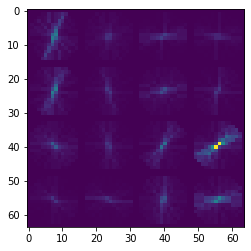

t:  36%|███████████████████████▎                                         | 288/804 [30:58<1:03:14,  7.35s/it, now=None]

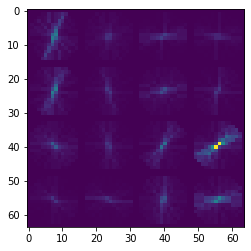

t:  36%|███████████████████████▎                                         | 289/804 [31:05<1:02:43,  7.31s/it, now=None]

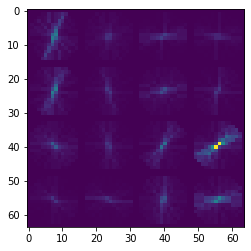

t:  36%|███████████████████████▍                                         | 290/804 [31:12<1:00:54,  7.11s/it, now=None]

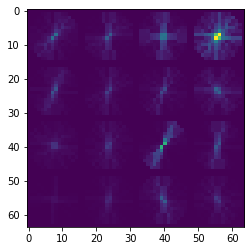

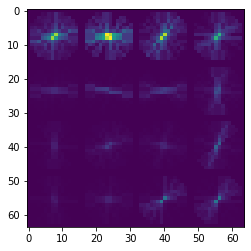

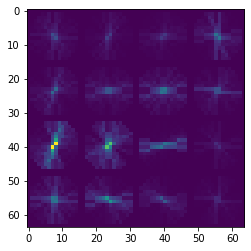

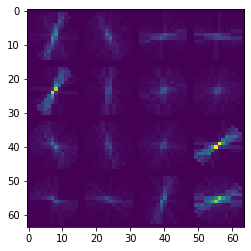

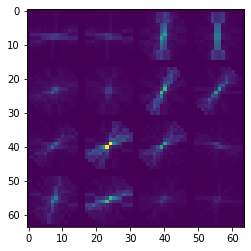

t:  36%|███████████████████████▌                                         | 291/804 [31:19<1:01:20,  7.17s/it, now=None]

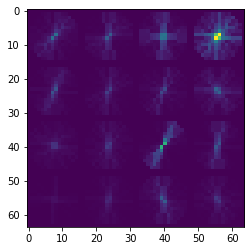

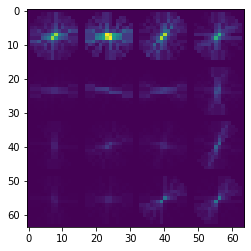

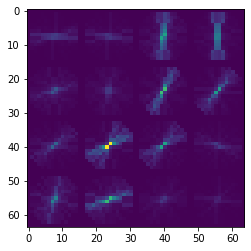

t:  36%|███████████████████████▌                                         | 292/804 [31:26<1:00:32,  7.09s/it, now=None]

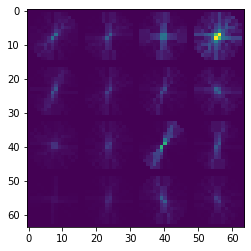

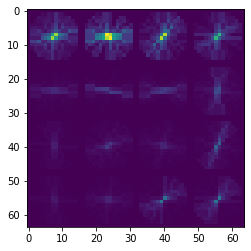

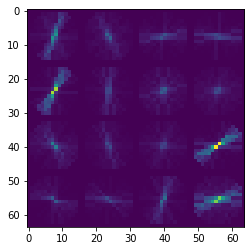

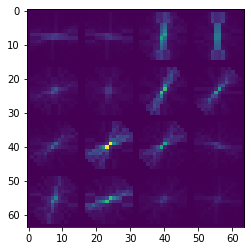

t:  36%|███████████████████████▋                                         | 293/804 [31:34<1:00:38,  7.12s/it, now=None]

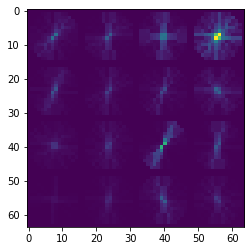

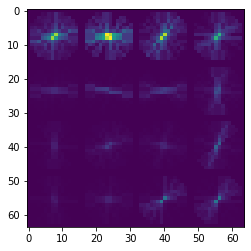

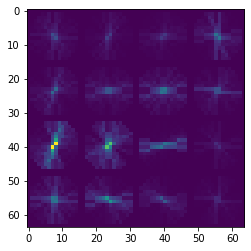

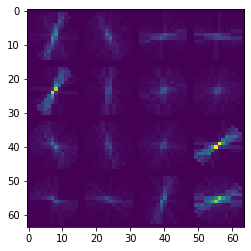

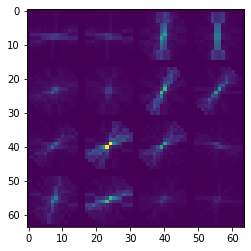

t:  37%|███████████████████████▊                                         | 294/804 [31:41<1:01:08,  7.19s/it, now=None]

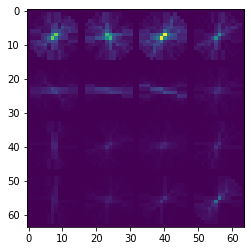

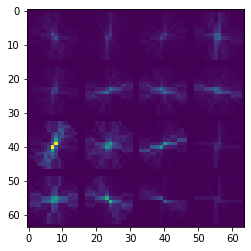

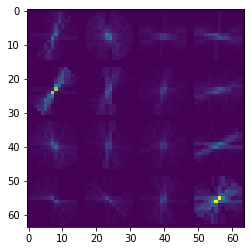

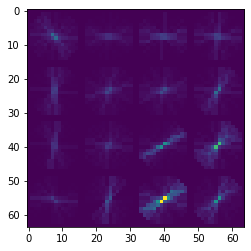

t:  37%|███████████████████████▊                                         | 295/804 [31:48<1:00:53,  7.18s/it, now=None]

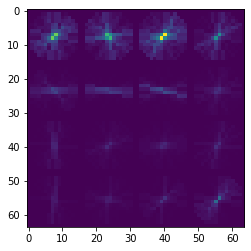

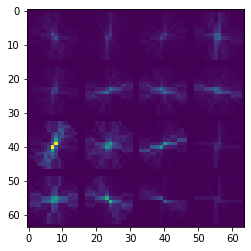

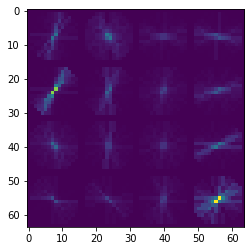

t:  37%|███████████████████████▉                                         | 296/804 [31:55<1:00:23,  7.13s/it, now=None]

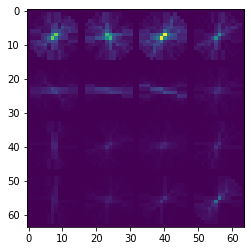

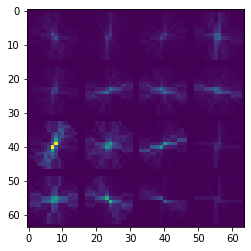

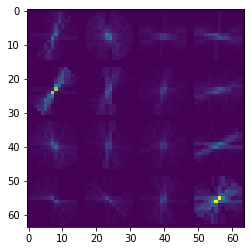

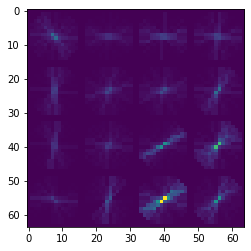

t:  37%|████████████████████████                                         | 297/804 [32:02<1:00:36,  7.17s/it, now=None]

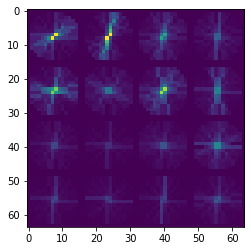

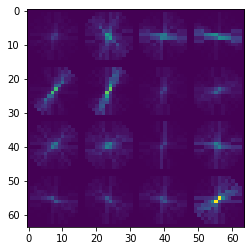

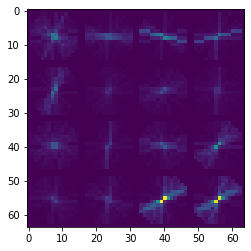

t:  37%|████████████████████████                                         | 298/804 [32:10<1:00:46,  7.21s/it, now=None]

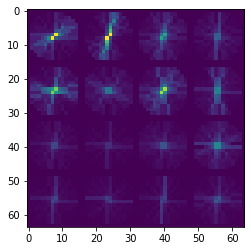

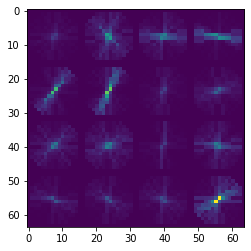

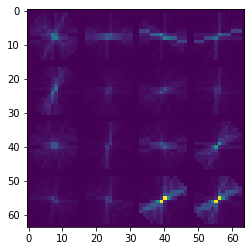

t:  37%|████████████████████████▏                                        | 299/804 [32:17<1:00:18,  7.17s/it, now=None]

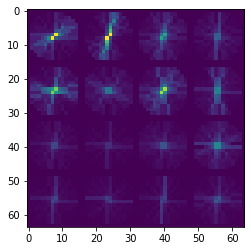

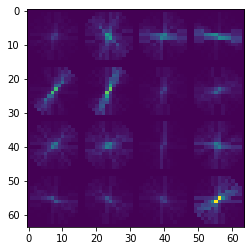

t:  37%|████████████████████████▎                                        | 300/804 [32:24<1:00:05,  7.15s/it, now=None]

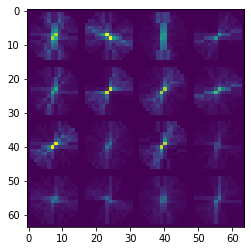

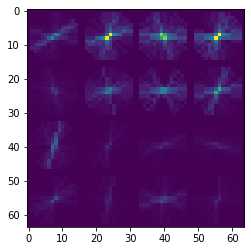

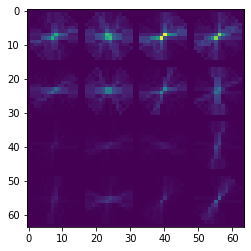

t:  37%|█████████████████████████                                          | 301/804 [32:31<59:29,  7.10s/it, now=None]

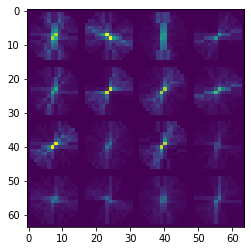

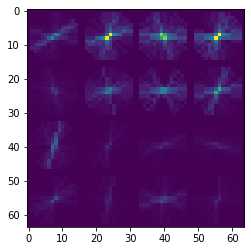

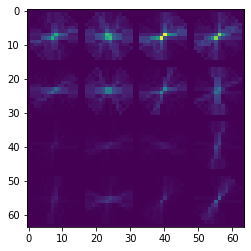

t:  38%|█████████████████████████▏                                         | 302/804 [32:38<59:12,  7.08s/it, now=None]

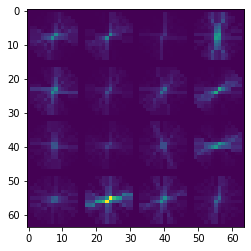

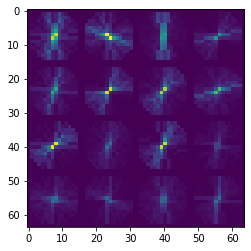

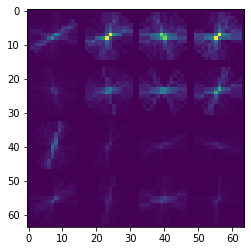

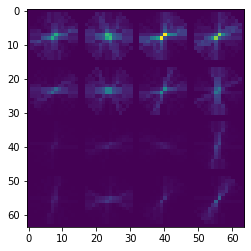

t:  38%|█████████████████████████▎                                         | 303/804 [32:45<59:37,  7.14s/it, now=None]

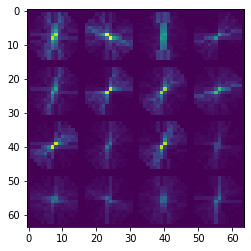

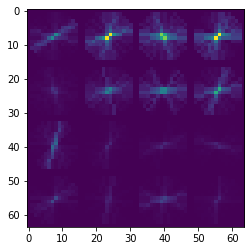

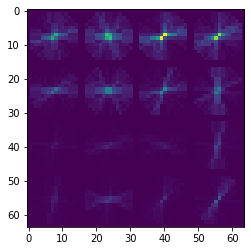

t:  38%|█████████████████████████▎                                         | 304/804 [32:52<59:12,  7.10s/it, now=None]

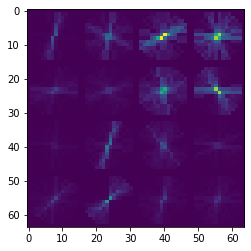

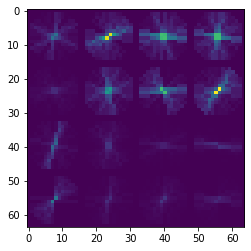

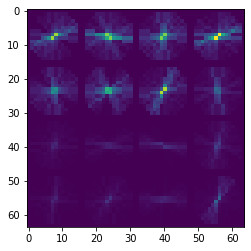

t:  38%|█████████████████████████▍                                         | 305/804 [32:59<58:55,  7.09s/it, now=None]

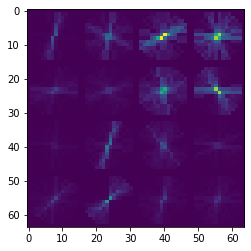

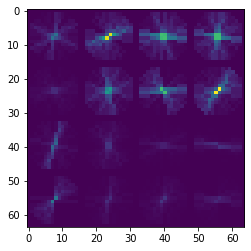

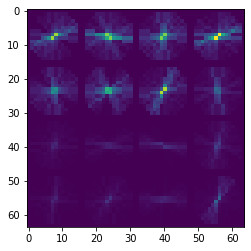

t:  38%|█████████████████████████▌                                         | 306/804 [33:06<59:04,  7.12s/it, now=None]

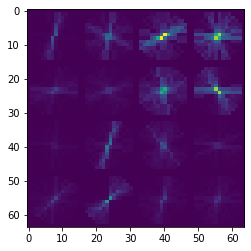

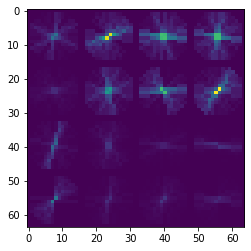

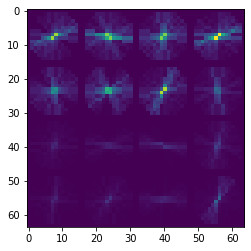

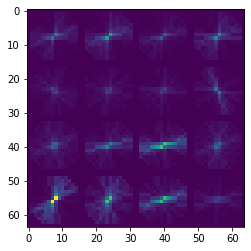

t:  38%|█████████████████████████▌                                         | 307/804 [33:14<59:57,  7.24s/it, now=None]

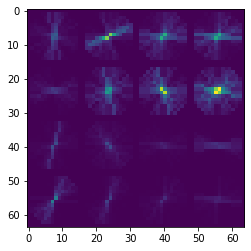

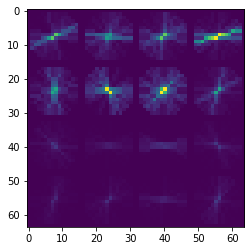

t:  38%|█████████████████████████▋                                         | 308/804 [33:21<59:41,  7.22s/it, now=None]

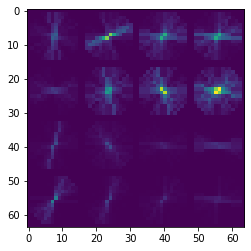

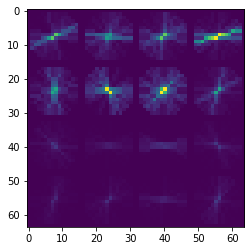

t:  38%|█████████████████████████▊                                         | 309/804 [33:28<59:24,  7.20s/it, now=None]

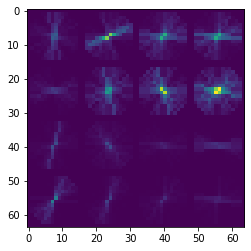

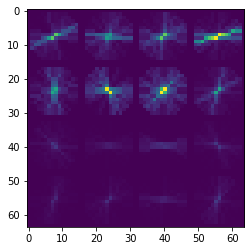

t:  39%|█████████████████████████▊                                         | 310/804 [33:35<58:34,  7.11s/it, now=None]

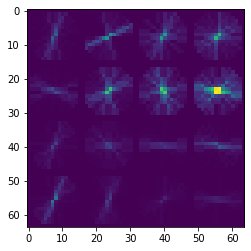

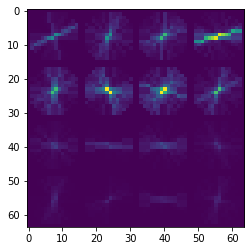

t:  39%|█████████████████████████▉                                         | 311/804 [33:42<57:51,  7.04s/it, now=None]

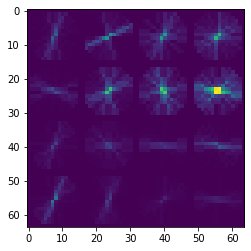

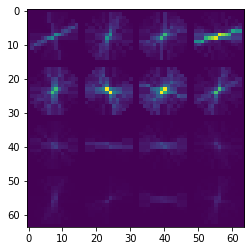

t:  39%|██████████████████████████                                         | 312/804 [33:49<58:12,  7.10s/it, now=None]

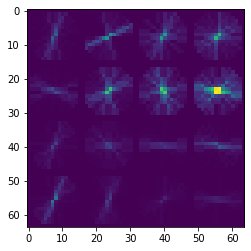

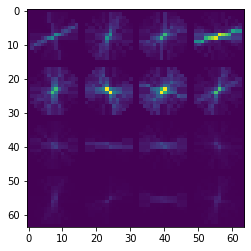

t:  39%|██████████████████████████                                         | 313/804 [33:56<57:50,  7.07s/it, now=None]

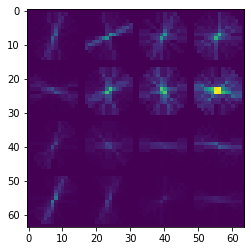

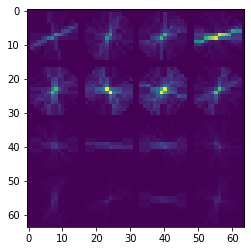

t:  39%|██████████████████████████▏                                        | 314/804 [34:04<58:38,  7.18s/it, now=None]

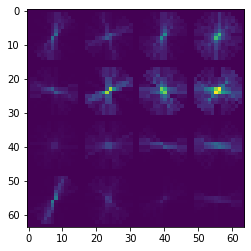

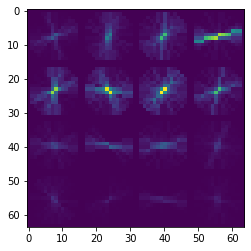

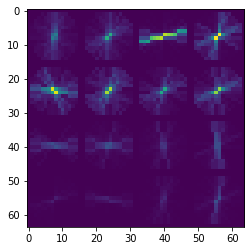

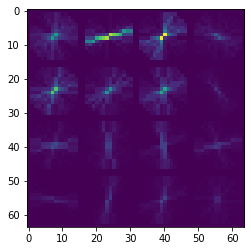

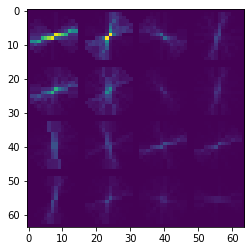

t:  39%|██████████████████████████▎                                        | 315/804 [34:11<58:50,  7.22s/it, now=None]

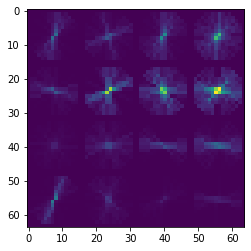

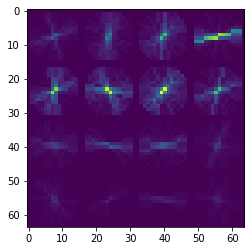

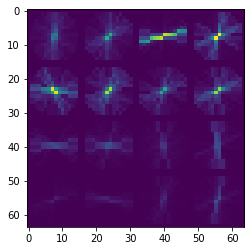

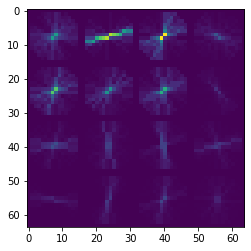

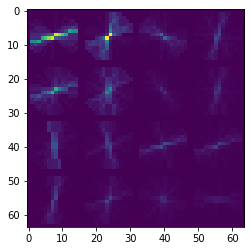

t:  39%|██████████████████████████▎                                        | 316/804 [34:18<59:20,  7.30s/it, now=None]

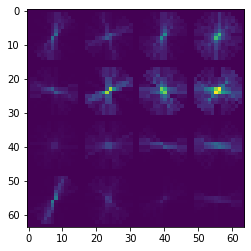

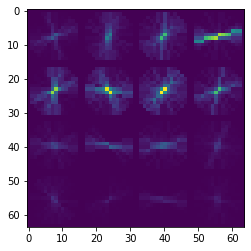

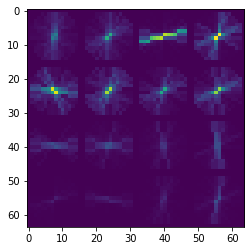

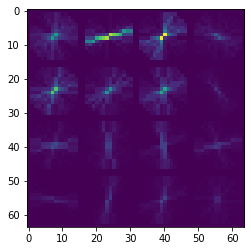

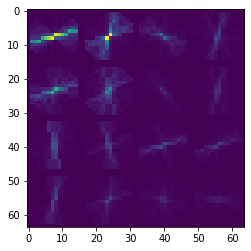

t:  39%|██████████████████████████▍                                        | 317/804 [34:26<59:28,  7.33s/it, now=None]

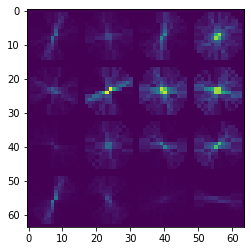

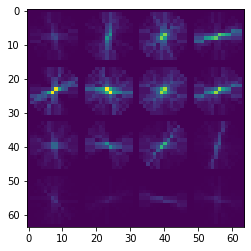

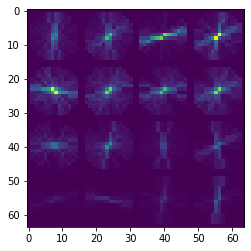

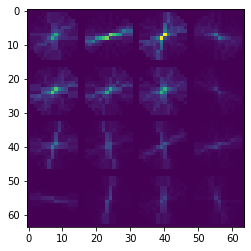

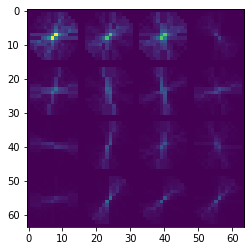

t:  40%|██████████████████████████▌                                        | 318/804 [34:33<59:56,  7.40s/it, now=None]

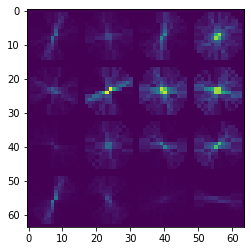

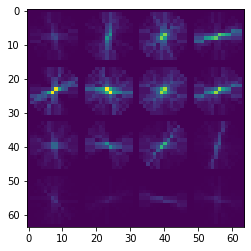

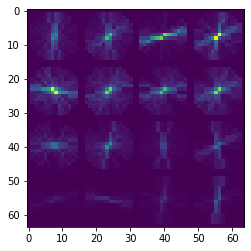

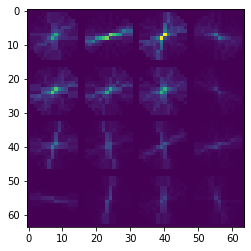

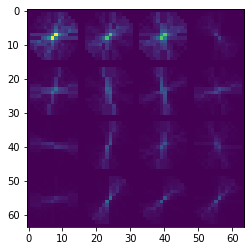

t:  40%|█████████████████████████▊                                       | 319/804 [34:41<1:00:28,  7.48s/it, now=None]

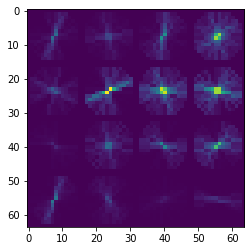

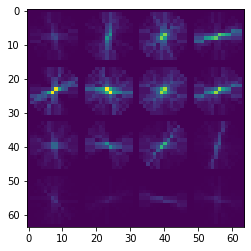

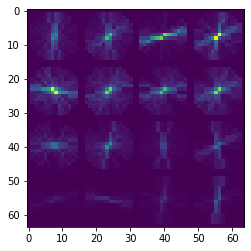

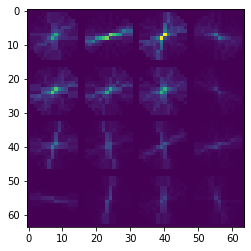

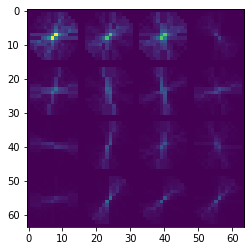

t:  40%|█████████████████████████▊                                       | 320/804 [34:49<1:00:35,  7.51s/it, now=None]

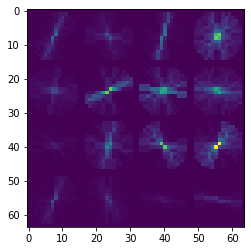

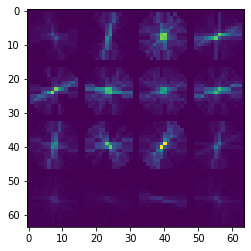

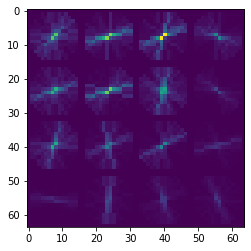

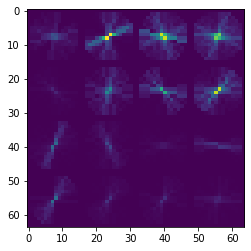

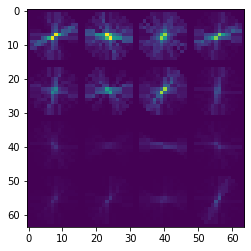

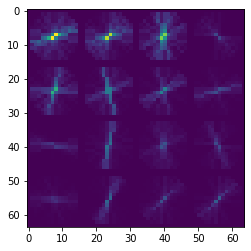

t:  40%|█████████████████████████▉                                       | 321/804 [34:56<1:00:53,  7.56s/it, now=None]

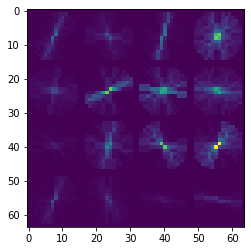

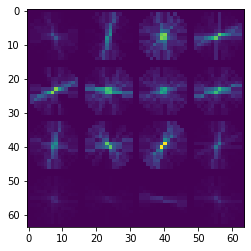

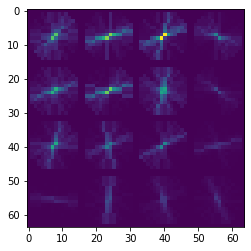

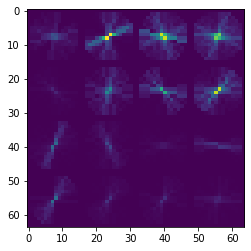

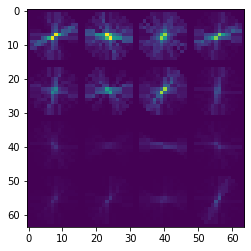

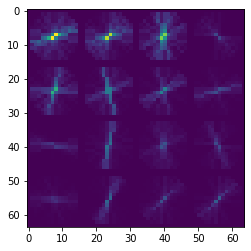

t:  40%|██████████████████████████                                       | 322/804 [35:04<1:01:12,  7.62s/it, now=None]

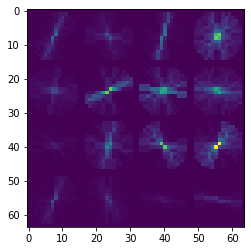

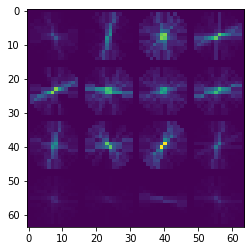

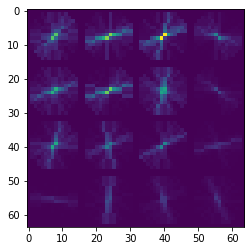

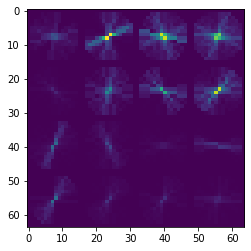

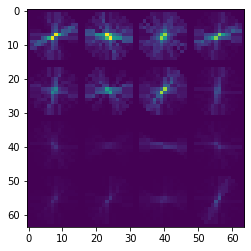

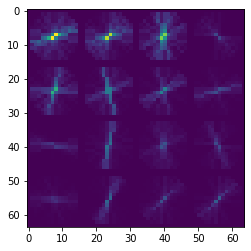

t:  40%|██████████████████████████                                       | 323/804 [35:12<1:01:14,  7.64s/it, now=None]

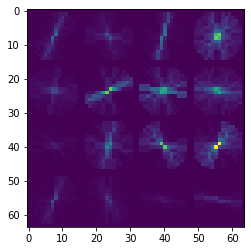

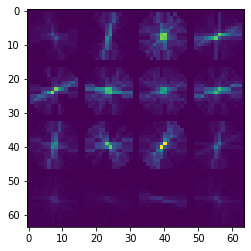

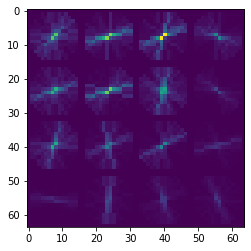

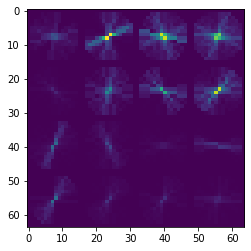

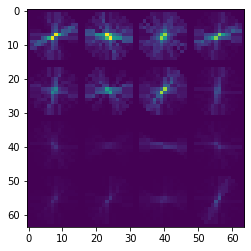

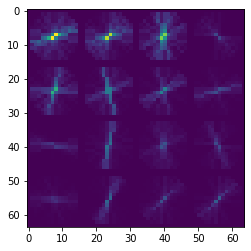

t:  40%|██████████████████████████▏                                      | 324/804 [35:20<1:01:28,  7.68s/it, now=None]

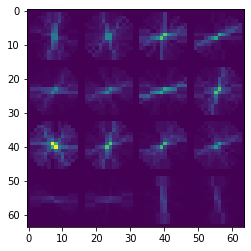

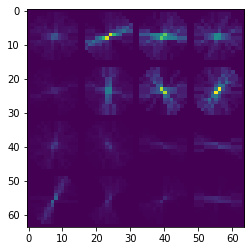

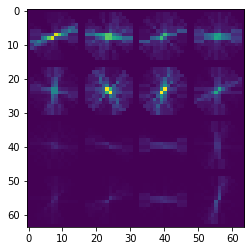

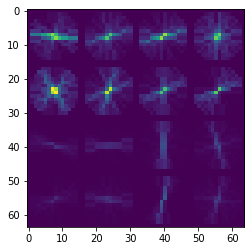

t:  40%|██████████████████████████▎                                      | 325/804 [35:27<1:00:23,  7.56s/it, now=None]

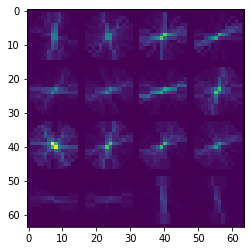

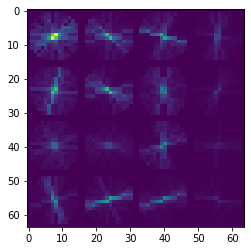

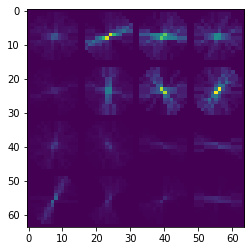

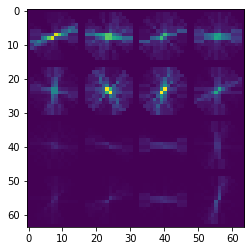

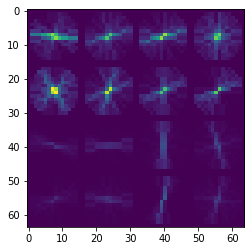

t:  41%|███████████████████████████▏                                       | 326/804 [35:34<59:41,  7.49s/it, now=None]

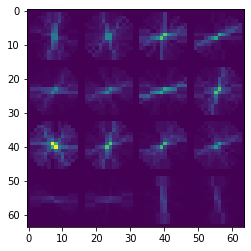

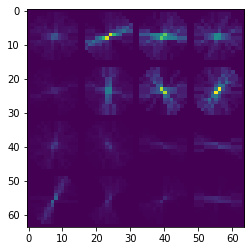

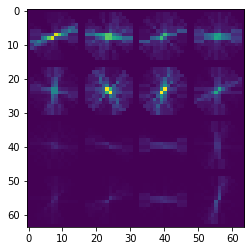

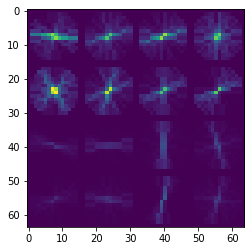

t:  41%|███████████████████████████▎                                       | 327/804 [35:41<58:53,  7.41s/it, now=None]

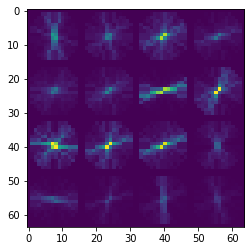

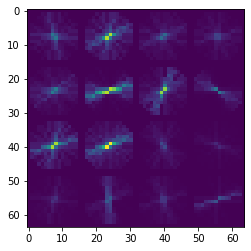

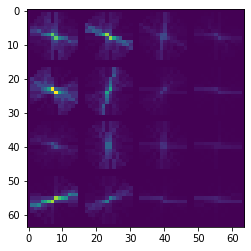

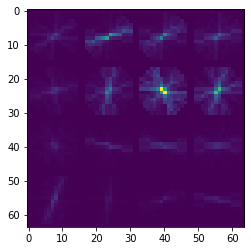

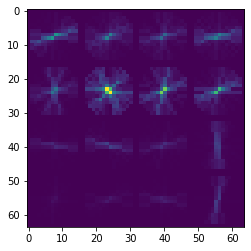

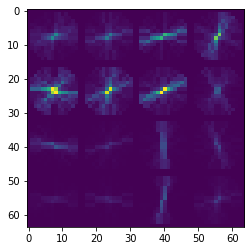

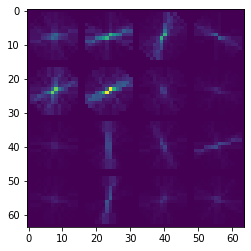

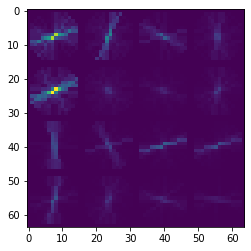

t:  41%|██████████████████████████▌                                      | 328/804 [35:50<1:02:37,  7.89s/it, now=None]

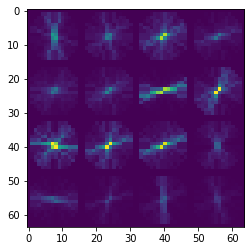

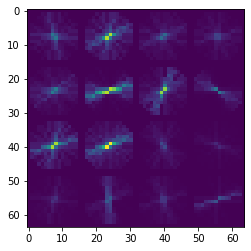

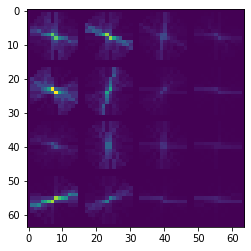

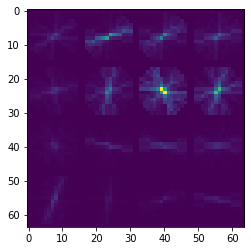

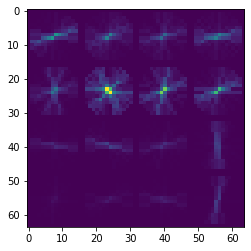

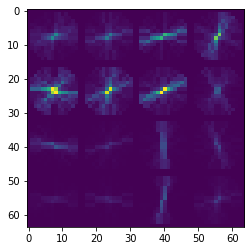

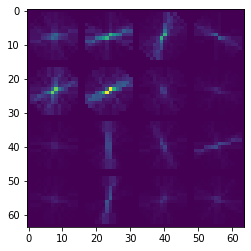

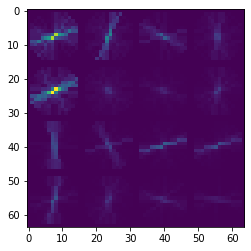

t:  41%|██████████████████████████▌                                      | 329/804 [35:59<1:03:41,  8.05s/it, now=None]

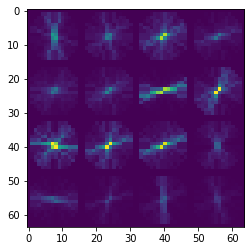

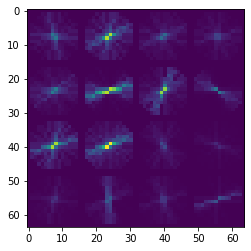

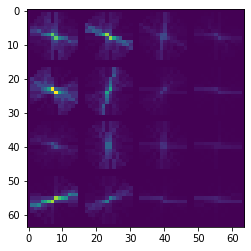

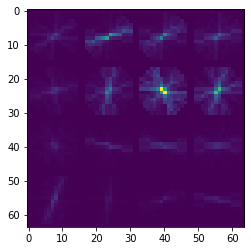

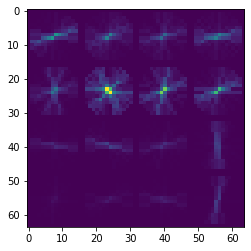

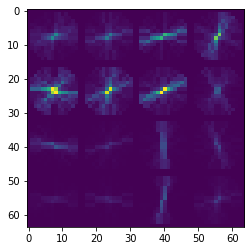

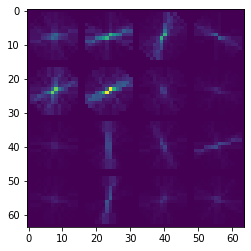

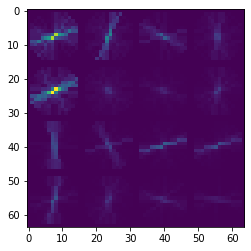

t:  41%|██████████████████████████▋                                      | 330/804 [36:07<1:03:42,  8.06s/it, now=None]

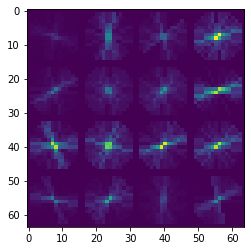

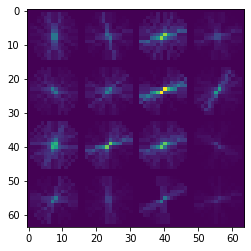

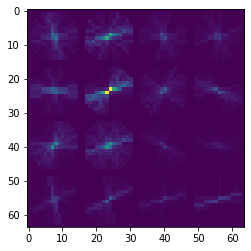

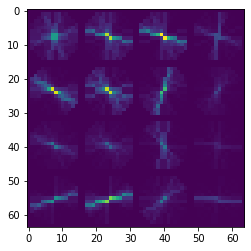

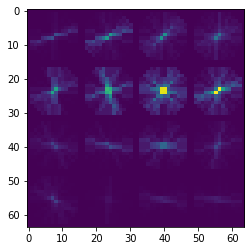

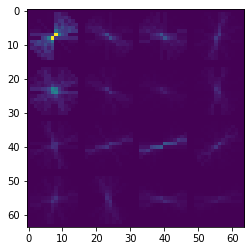

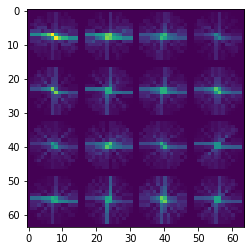

t:  41%|██████████████████████████▊                                      | 331/804 [36:15<1:02:34,  7.94s/it, now=None]

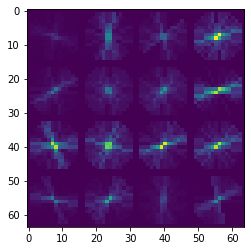

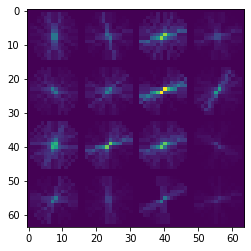

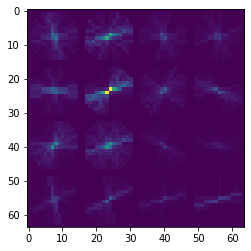

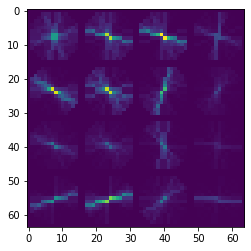

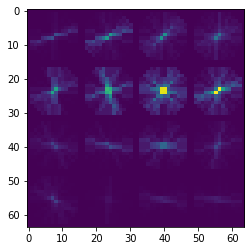

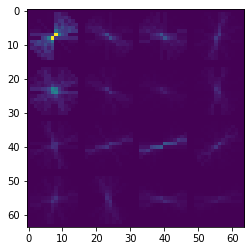

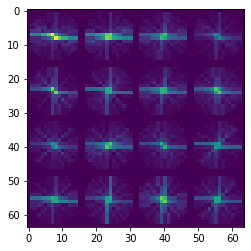

t:  41%|██████████████████████████▊                                      | 332/804 [36:22<1:02:08,  7.90s/it, now=None]

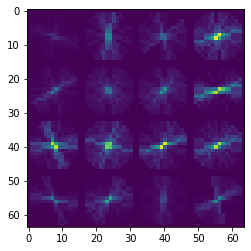

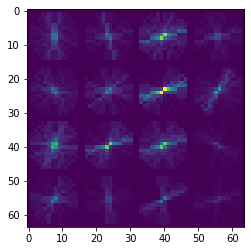

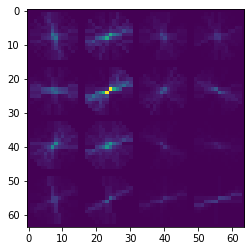

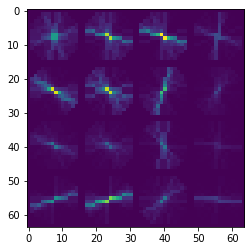

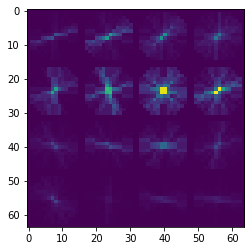

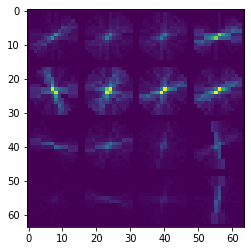

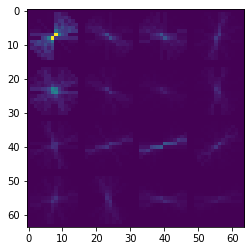

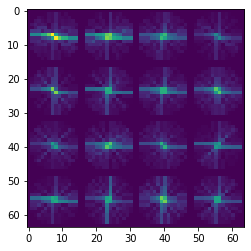

t:  41%|██████████████████████████▉                                      | 333/804 [36:30<1:02:11,  7.92s/it, now=None]

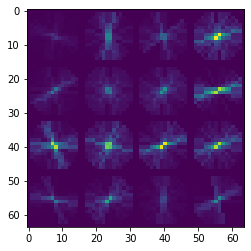

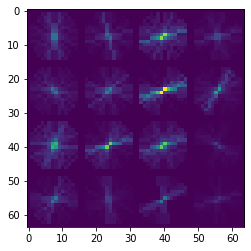

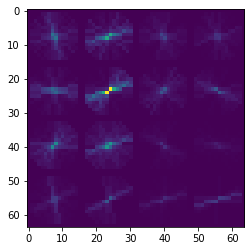

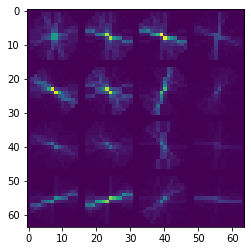

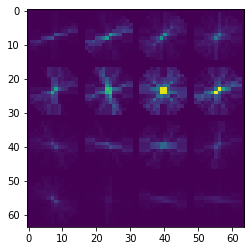

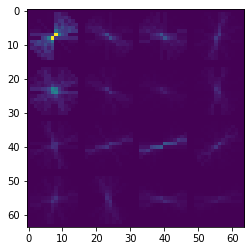

t:  42%|███████████████████████████                                      | 334/804 [36:38<1:01:46,  7.89s/it, now=None]

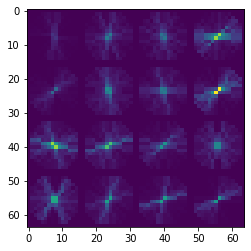

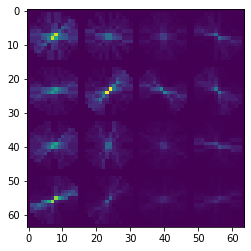

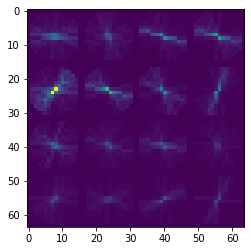

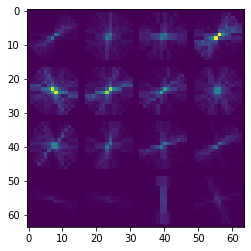

t:  42%|███████████████████████████                                      | 335/804 [36:45<1:00:07,  7.69s/it, now=None]

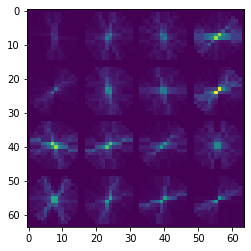

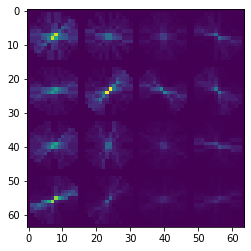

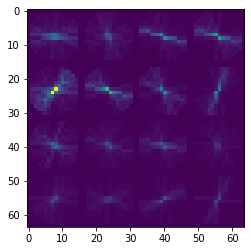

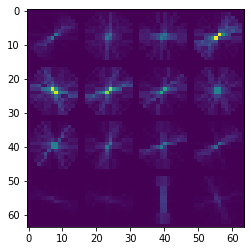

t:  42%|████████████████████████████                                       | 336/804 [36:53<59:08,  7.58s/it, now=None]

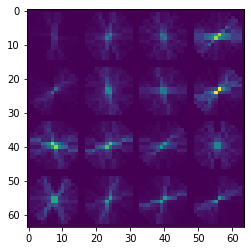

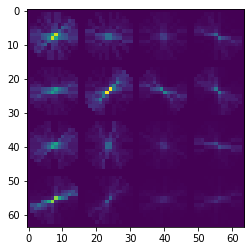

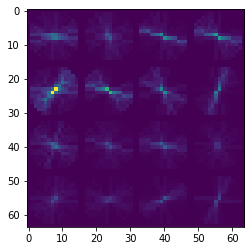

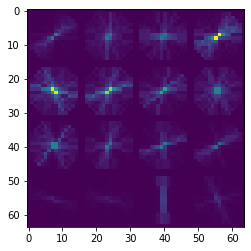

t:  42%|████████████████████████████                                       | 337/804 [37:00<58:39,  7.54s/it, now=None]

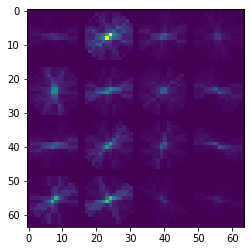

t:  42%|████████████████████████████▏                                      | 338/804 [37:07<57:05,  7.35s/it, now=None]

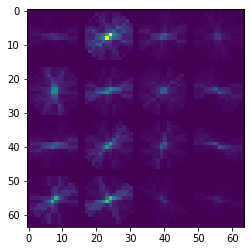

t:  42%|████████████████████████████▎                                      | 339/804 [37:14<56:20,  7.27s/it, now=None]

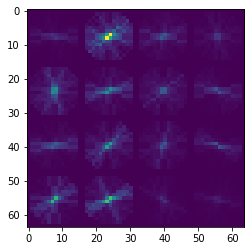

t:  42%|████████████████████████████▎                                      | 340/804 [37:21<55:06,  7.13s/it, now=None]

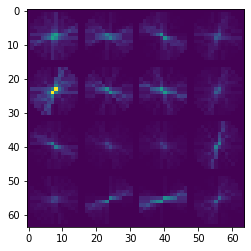

t:  42%|████████████████████████████▍                                      | 341/804 [37:28<54:16,  7.03s/it, now=None]

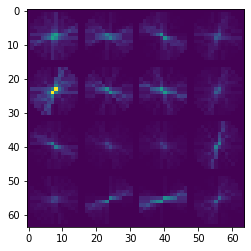

t:  43%|████████████████████████████▌                                      | 342/804 [37:34<53:07,  6.90s/it, now=None]

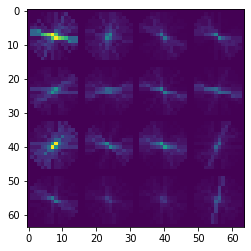

t:  43%|████████████████████████████▌                                      | 343/804 [37:41<52:32,  6.84s/it, now=None]

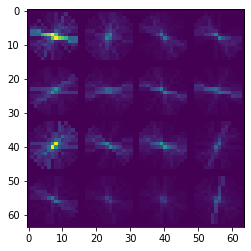

t:  45%|██████████████████████████████                                     | 360/804 [39:35<49:34,  6.70s/it, now=None]

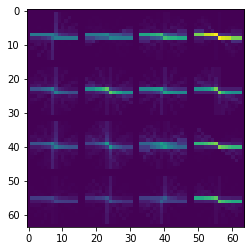

t:  45%|██████████████████████████████                                     | 361/804 [39:42<49:51,  6.75s/it, now=None]

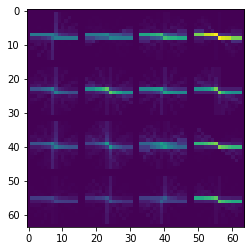

t:  45%|██████████████████████████████▏                                    | 362/804 [39:50<51:32,  7.00s/it, now=None]

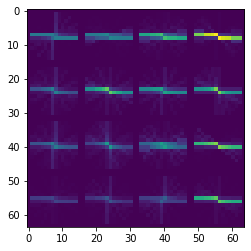

t:  45%|██████████████████████████████▎                                    | 363/804 [39:57<52:15,  7.11s/it, now=None]

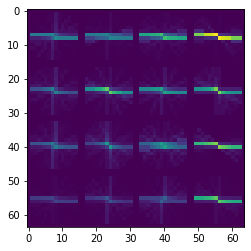

t:  48%|███████████████████████████████▊                                   | 382/804 [42:16<49:39,  7.06s/it, now=None]

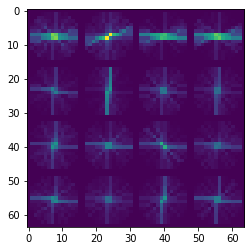

t:  48%|████████████████████████████████                                   | 384/804 [42:29<47:25,  6.78s/it, now=None]

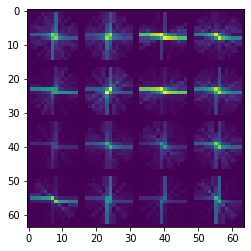

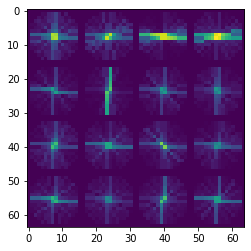

t:  48%|████████████████████████████████                                   | 385/804 [42:36<47:23,  6.79s/it, now=None]

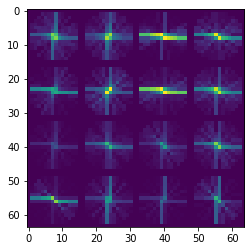

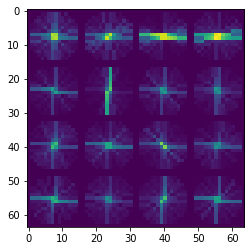

t:  48%|████████████████████████████████▏                                  | 386/804 [42:43<47:07,  6.76s/it, now=None]

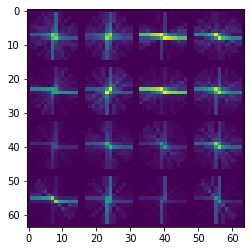

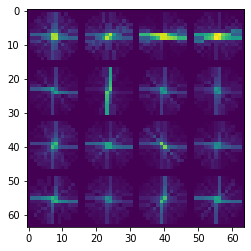

t:  49%|████████████████████████████████▌                                  | 390/804 [43:09<44:35,  6.46s/it, now=None]

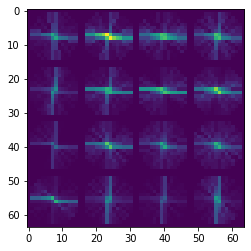

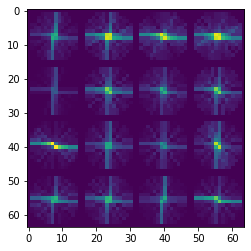

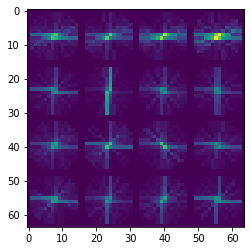

t:  49%|████████████████████████████████▌                                  | 391/804 [43:15<45:09,  6.56s/it, now=None]

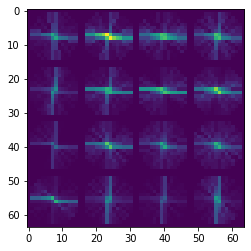

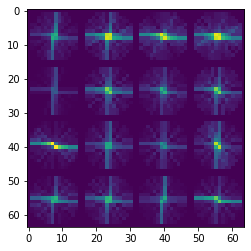

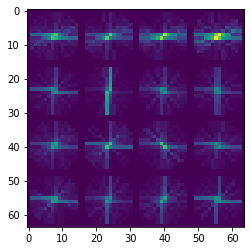

t:  49%|████████████████████████████████▋                                  | 392/804 [43:22<45:29,  6.62s/it, now=None]

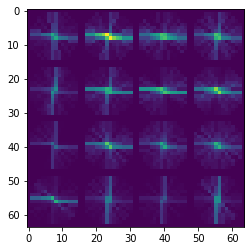

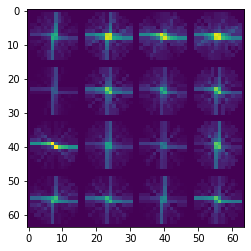

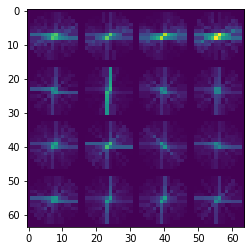

t:  49%|████████████████████████████████▊                                  | 393/804 [43:29<45:40,  6.67s/it, now=None]

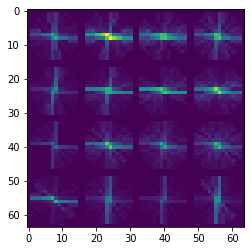

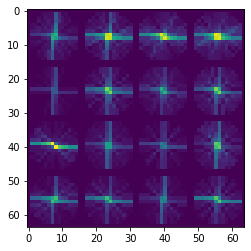

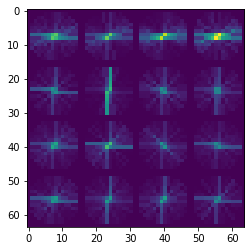

t:  50%|█████████████████████████████████▎                                 | 400/804 [44:13<42:16,  6.28s/it, now=None]

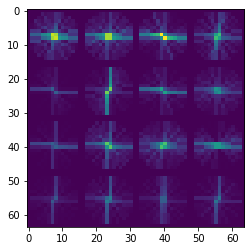

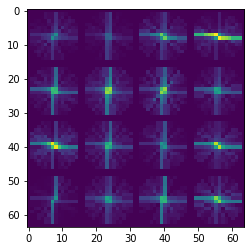

t:  50%|█████████████████████████████████▍                                 | 401/804 [44:19<42:26,  6.32s/it, now=None]

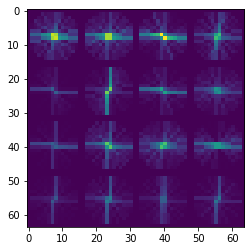

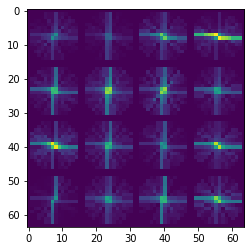

t:  50%|█████████████████████████████████▌                                 | 402/804 [44:26<43:20,  6.47s/it, now=None]

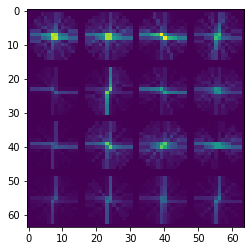

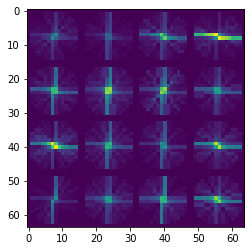

t:  50%|█████████████████████████████████▌                                 | 403/804 [44:33<43:24,  6.50s/it, now=None]

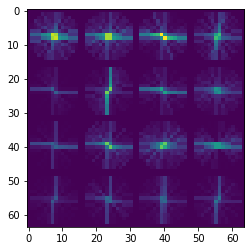

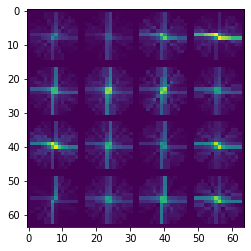

t:  50%|█████████████████████████████████▊                                 | 406/804 [44:52<42:23,  6.39s/it, now=None]

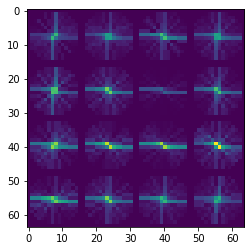

t:  51%|█████████████████████████████████▉                                 | 407/804 [44:58<42:24,  6.41s/it, now=None]

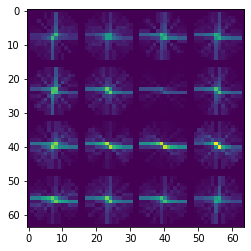

t:  51%|██████████████████████████████████                                 | 408/804 [45:05<42:15,  6.40s/it, now=None]

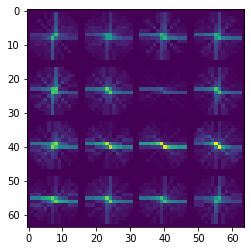

t:  51%|██████████████████████████████████                                 | 409/804 [45:11<42:04,  6.39s/it, now=None]

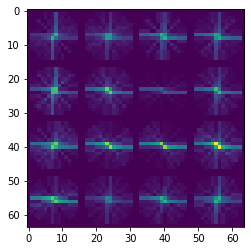

t:  51%|██████████████████████████████████▏                                | 410/804 [45:18<41:57,  6.39s/it, now=None]

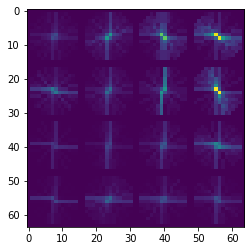

t:  51%|██████████████████████████████████▎                                | 411/804 [45:24<41:46,  6.38s/it, now=None]

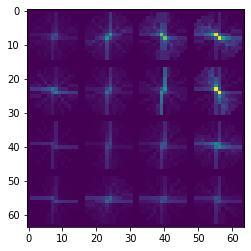

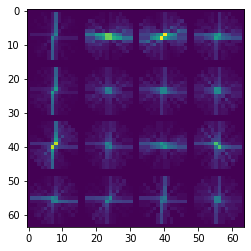

t:  51%|██████████████████████████████████▎                                | 412/804 [45:30<41:44,  6.39s/it, now=None]

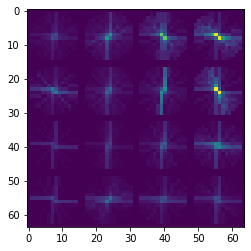

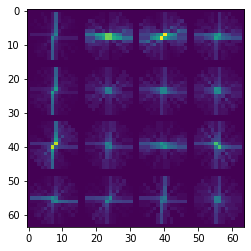

t:  51%|██████████████████████████████████▍                                | 413/804 [45:37<41:37,  6.39s/it, now=None]

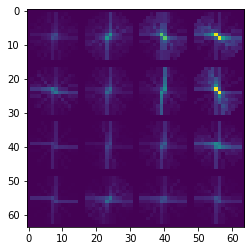

t:  51%|██████████████████████████████████▌                                | 414/804 [45:43<41:39,  6.41s/it, now=None]

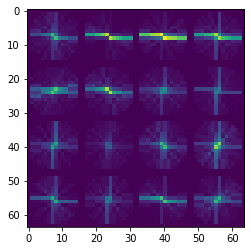

t:  52%|██████████████████████████████████▌                                | 415/804 [45:49<41:23,  6.38s/it, now=None]

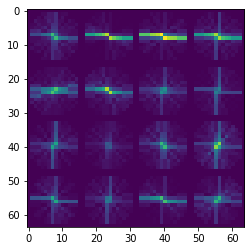

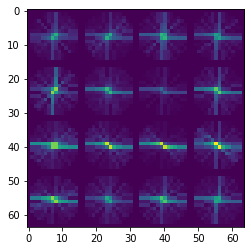

t:  52%|██████████████████████████████████▋                                | 416/804 [45:56<41:31,  6.42s/it, now=None]

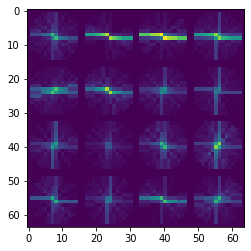

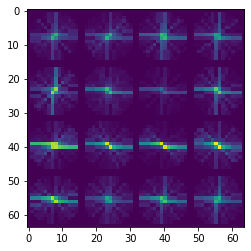

t:  52%|██████████████████████████████████▊                                | 417/804 [46:03<42:05,  6.53s/it, now=None]

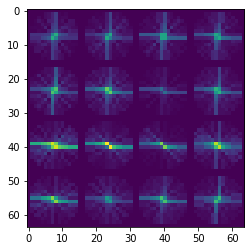

t:  53%|███████████████████████████████████▊                               | 430/804 [47:25<39:11,  6.29s/it, now=None]

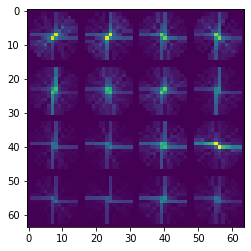

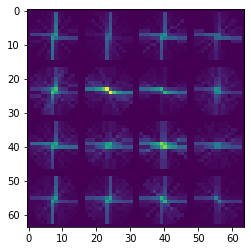

t:  54%|███████████████████████████████████▉                               | 431/804 [47:31<39:36,  6.37s/it, now=None]

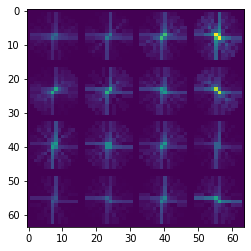

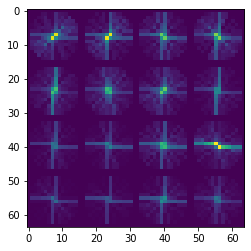

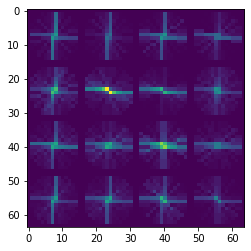

t:  54%|████████████████████████████████████                               | 432/804 [47:38<40:00,  6.45s/it, now=None]

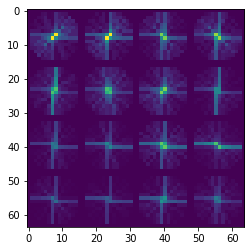

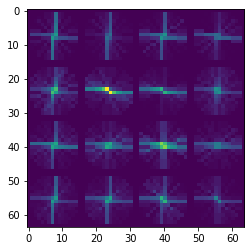

t:  54%|████████████████████████████████████                               | 433/804 [47:44<40:02,  6.48s/it, now=None]

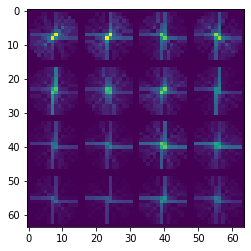

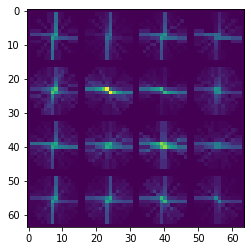

t:  54%|████████████████████████████████████▏                              | 434/804 [47:51<40:37,  6.59s/it, now=None]

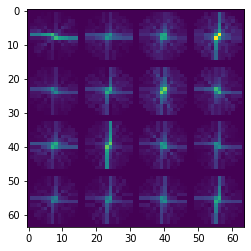

t:  54%|████████████████████████████████████▎                              | 435/804 [47:58<40:04,  6.52s/it, now=None]

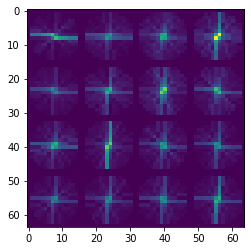

t:  54%|████████████████████████████████████▎                              | 436/804 [48:04<39:42,  6.47s/it, now=None]

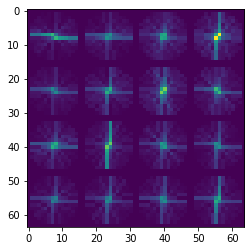

t:  55%|████████████████████████████████████▋                              | 440/804 [48:29<38:39,  6.37s/it, now=None]

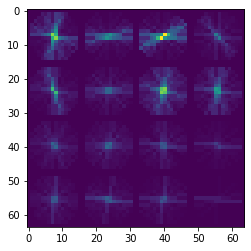

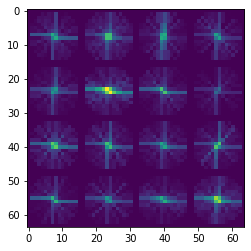

t:  55%|████████████████████████████████████▊                              | 441/804 [48:36<38:49,  6.42s/it, now=None]

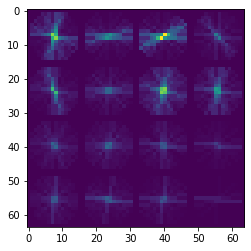

t:  55%|████████████████████████████████████▊                              | 442/804 [48:42<38:40,  6.41s/it, now=None]

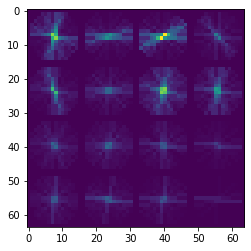

t:  55%|████████████████████████████████████▉                              | 443/804 [48:49<38:19,  6.37s/it, now=None]

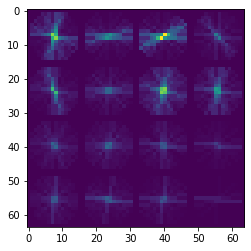

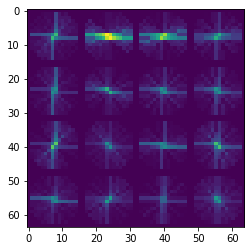

t:  55%|█████████████████████████████████████                              | 444/804 [48:55<38:33,  6.43s/it, now=None]

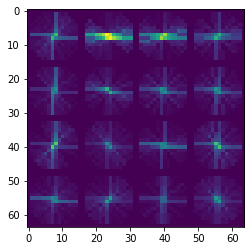

t:  55%|█████████████████████████████████████                              | 445/804 [49:02<38:28,  6.43s/it, now=None]

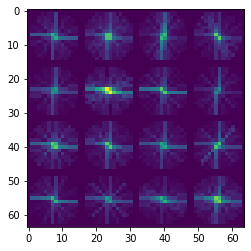

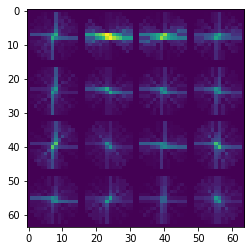

t:  55%|█████████████████████████████████████▏                             | 446/804 [49:08<38:28,  6.45s/it, now=None]

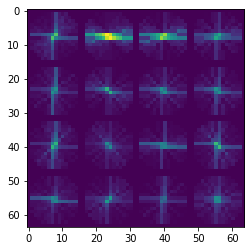

t:  56%|█████████████████████████████████████▎                             | 447/804 [49:15<38:18,  6.44s/it, now=None]

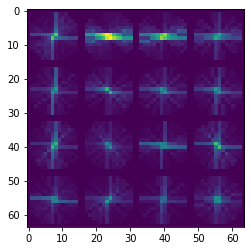

t:  56%|█████████████████████████████████████▎                             | 448/804 [49:21<38:05,  6.42s/it, now=None]

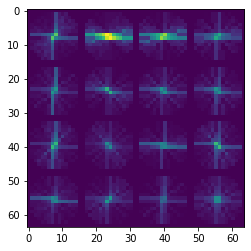

t:  56%|█████████████████████████████████████▍                             | 449/804 [49:27<38:00,  6.42s/it, now=None]

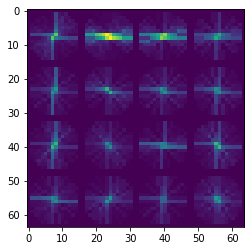

t:  56%|█████████████████████████████████████▌                             | 450/804 [49:34<37:40,  6.39s/it, now=None]

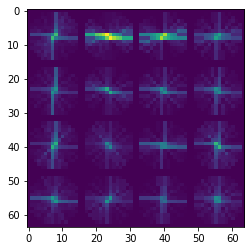

t:  56%|█████████████████████████████████████▌                             | 451/804 [49:40<37:38,  6.40s/it, now=None]

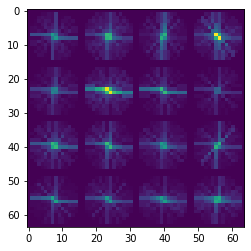

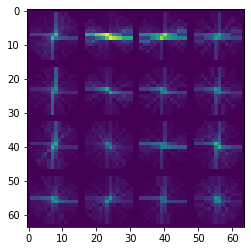

t:  56%|█████████████████████████████████████▋                             | 452/804 [49:47<37:53,  6.46s/it, now=None]

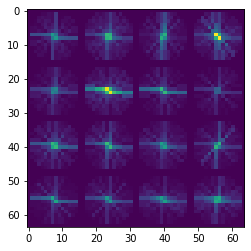

t:  56%|█████████████████████████████████████▊                             | 453/804 [49:53<37:32,  6.42s/it, now=None]

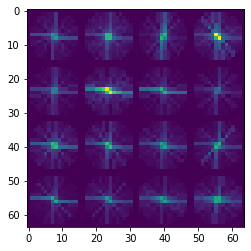

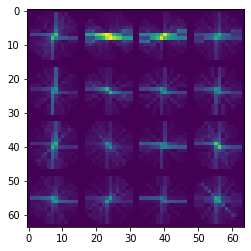

t:  56%|█████████████████████████████████████▊                             | 454/804 [50:00<37:42,  6.46s/it, now=None]

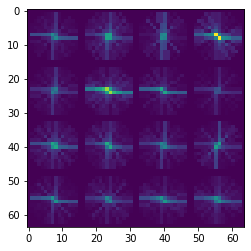

t:  57%|█████████████████████████████████████▉                             | 455/804 [50:06<37:34,  6.46s/it, now=None]

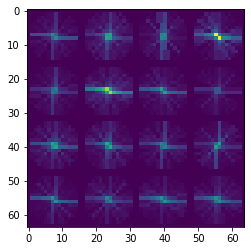

t:  57%|██████████████████████████████████████                             | 456/804 [50:13<37:33,  6.48s/it, now=None]

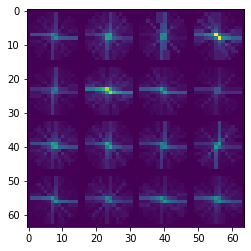

t:  57%|██████████████████████████████████████                             | 457/804 [50:19<37:47,  6.53s/it, now=None]

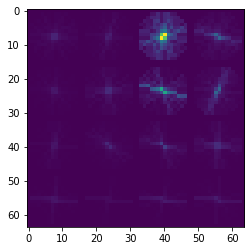

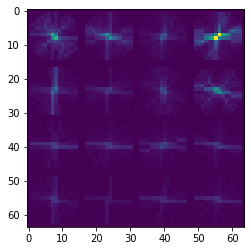

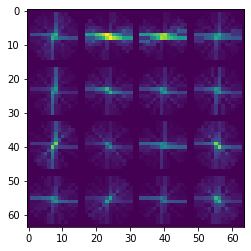

t:  57%|██████████████████████████████████████▏                            | 458/804 [50:26<37:54,  6.57s/it, now=None]

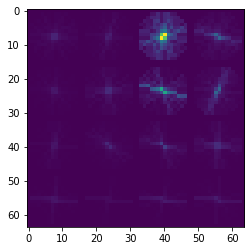

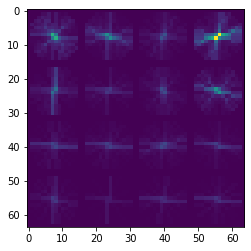

t:  57%|██████████████████████████████████████▎                            | 459/804 [50:32<37:47,  6.57s/it, now=None]

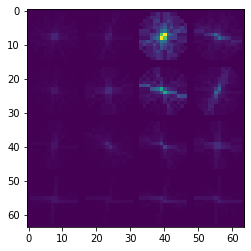

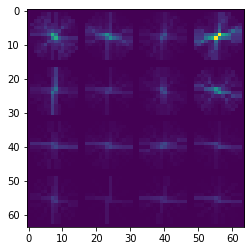

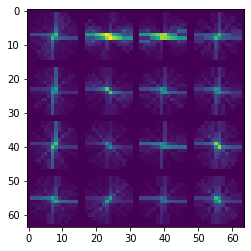

t:  57%|██████████████████████████████████████▎                            | 460/804 [50:39<37:40,  6.57s/it, now=None]

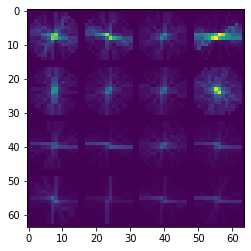

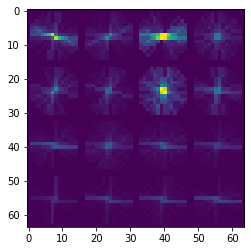

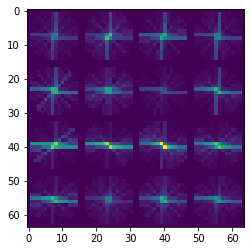

t:  57%|██████████████████████████████████████▍                            | 461/804 [50:46<37:41,  6.59s/it, now=None]

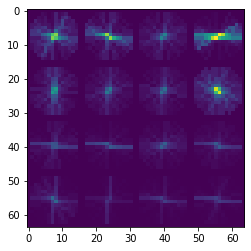

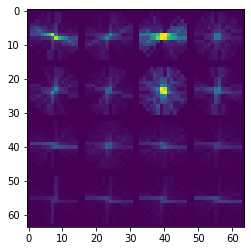

t:  57%|██████████████████████████████████████▌                            | 462/804 [50:52<37:59,  6.67s/it, now=None]

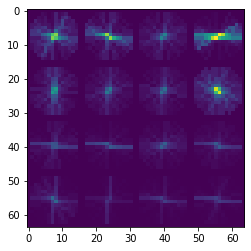

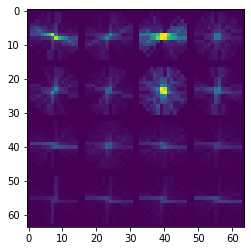

t:  58%|██████████████████████████████████████▌                            | 463/804 [50:59<37:39,  6.63s/it, now=None]

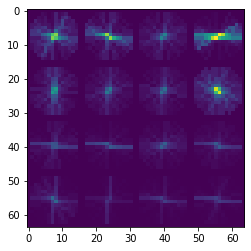

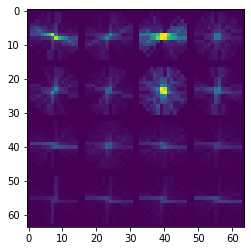

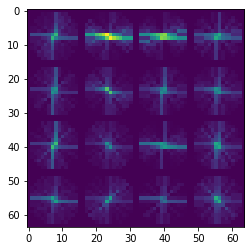

t:  58%|██████████████████████████████████████▋                            | 464/804 [51:06<37:46,  6.67s/it, now=None]

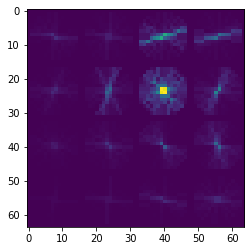

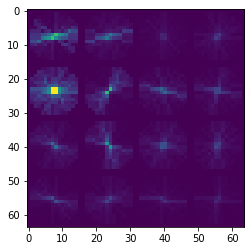

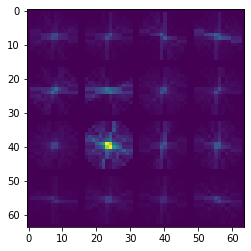

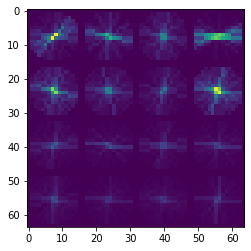

t:  58%|██████████████████████████████████████▊                            | 465/804 [51:13<37:56,  6.72s/it, now=None]

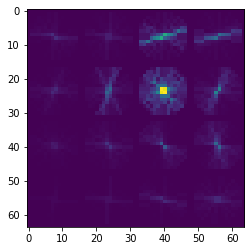

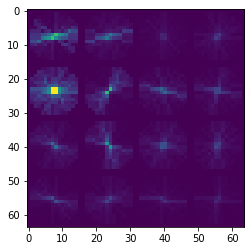

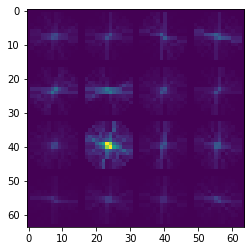

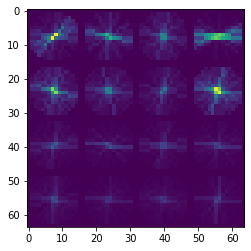

t:  58%|██████████████████████████████████████▊                            | 466/804 [51:20<38:21,  6.81s/it, now=None]

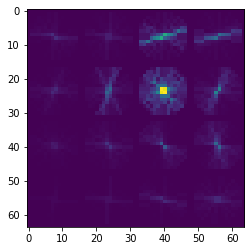

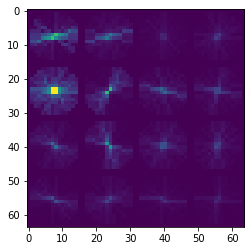

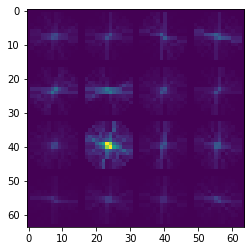

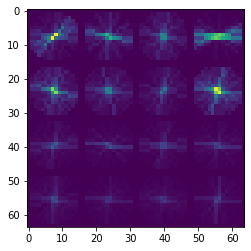

t:  58%|██████████████████████████████████████▉                            | 467/804 [51:27<38:25,  6.84s/it, now=None]

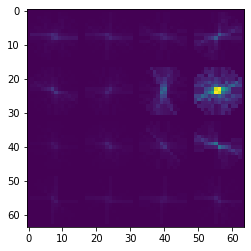

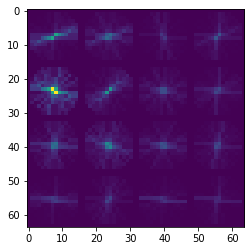

t:  58%|███████████████████████████████████████                            | 468/804 [51:33<37:46,  6.75s/it, now=None]

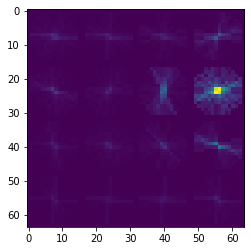

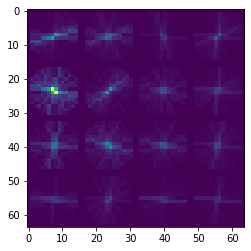

t:  58%|███████████████████████████████████████                            | 469/804 [51:40<37:29,  6.72s/it, now=None]

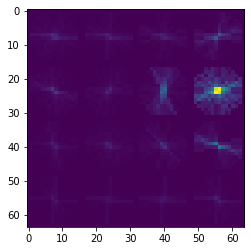

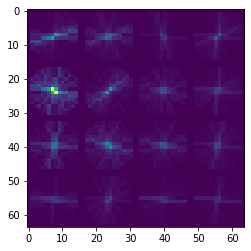

t:  58%|███████████████████████████████████████▏                           | 470/804 [51:46<37:25,  6.72s/it, now=None]

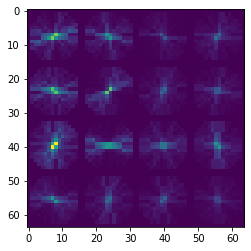

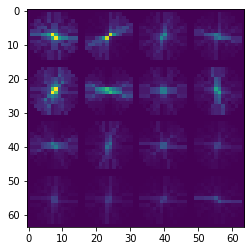

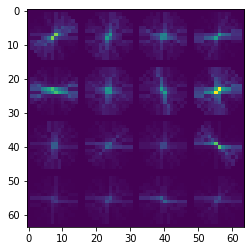

t:  59%|███████████████████████████████████████▎                           | 471/804 [51:53<37:27,  6.75s/it, now=None]

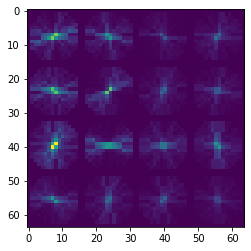

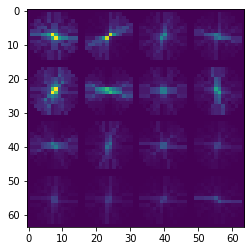

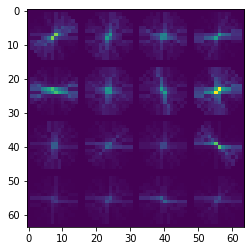

t:  59%|███████████████████████████████████████▎                           | 472/804 [52:00<37:15,  6.73s/it, now=None]

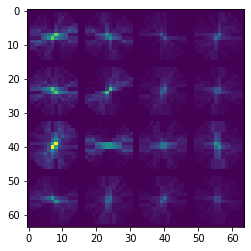

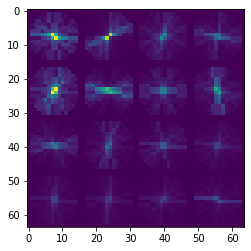

t:  59%|███████████████████████████████████████▍                           | 473/804 [52:07<36:55,  6.69s/it, now=None]

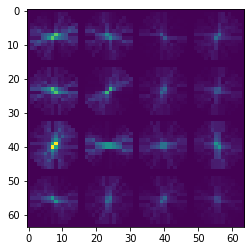

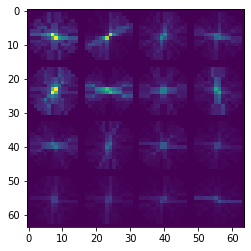

t:  59%|███████████████████████████████████████▌                           | 474/804 [52:13<36:41,  6.67s/it, now=None]

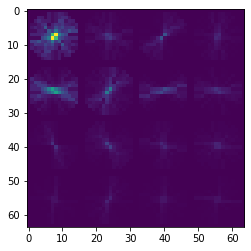

t:  59%|███████████████████████████████████████▌                           | 475/804 [52:19<35:51,  6.54s/it, now=None]

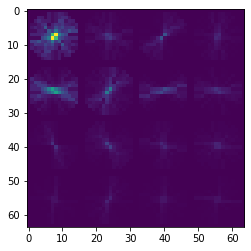

t:  59%|███████████████████████████████████████▋                           | 476/804 [52:26<35:35,  6.51s/it, now=None]

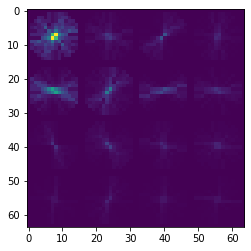

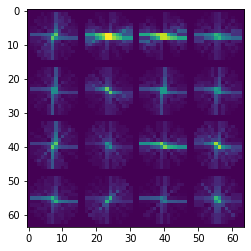

t:  59%|███████████████████████████████████████▊                           | 477/804 [52:32<35:30,  6.52s/it, now=None]

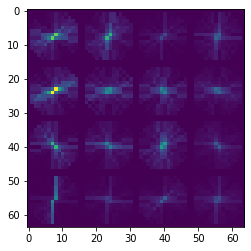

t:  59%|███████████████████████████████████████▊                           | 478/804 [52:39<35:09,  6.47s/it, now=None]

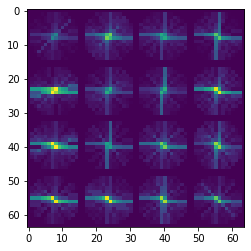

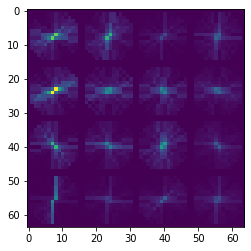

t:  60%|███████████████████████████████████████▉                           | 479/804 [52:45<35:20,  6.52s/it, now=None]

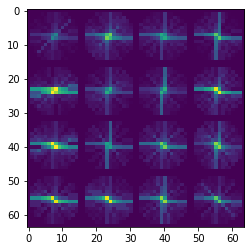

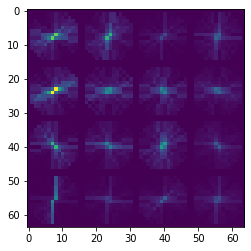

t:  60%|████████████████████████████████████████                           | 480/804 [52:52<35:24,  6.56s/it, now=None]

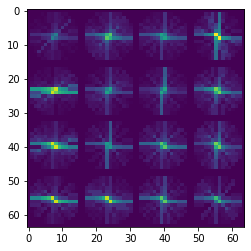

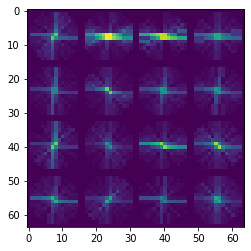

t:  60%|████████████████████████████████████████                           | 481/804 [52:59<35:27,  6.59s/it, now=None]

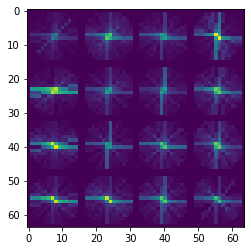

t:  60%|████████████████████████████████████████▎                          | 484/804 [53:17<33:50,  6.34s/it, now=None]

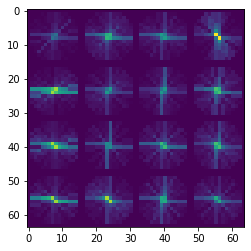

t:  60%|████████████████████████████████████████▍                          | 485/804 [53:24<33:52,  6.37s/it, now=None]

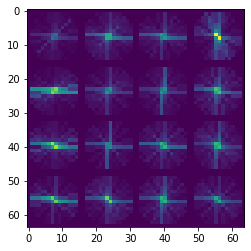

t:  60%|████████████████████████████████████████▌                          | 486/804 [53:30<33:54,  6.40s/it, now=None]

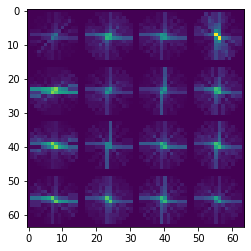

t:  61%|████████████████████████████████████████▌                          | 487/804 [53:37<33:51,  6.41s/it, now=None]

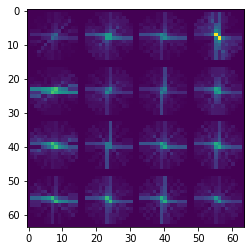

t:  61%|█████████████████████████████████████████▏                         | 494/804 [54:21<32:24,  6.27s/it, now=None]

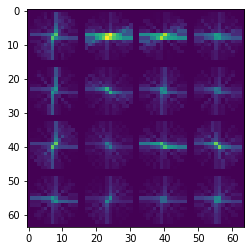

t:  62%|█████████████████████████████████████████▏                         | 495/804 [54:27<32:38,  6.34s/it, now=None]

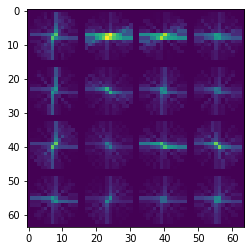

t:  62%|█████████████████████████████████████████▎                         | 496/804 [54:34<32:34,  6.35s/it, now=None]

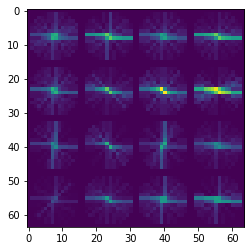

t:  62%|█████████████████████████████████████████▍                         | 497/804 [54:40<32:20,  6.32s/it, now=None]

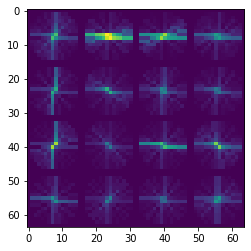

t:  62%|█████████████████████████████████████████▌                         | 498/804 [54:46<32:21,  6.34s/it, now=None]

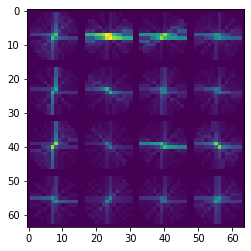

t:  62%|█████████████████████████████████████████▌                         | 499/804 [54:53<32:11,  6.33s/it, now=None]

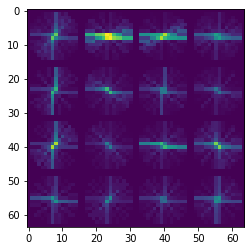

t:  64%|███████████████████████████████████████████                        | 517/804 [56:45<29:54,  6.25s/it, now=None]

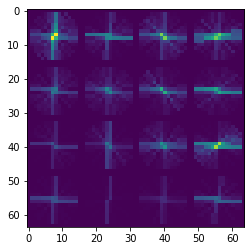

t:  64%|███████████████████████████████████████████▏                       | 518/804 [56:52<30:01,  6.30s/it, now=None]

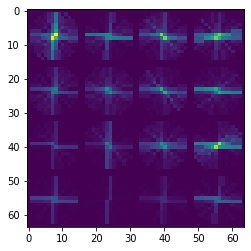

t:  65%|███████████████████████████████████████████▎                       | 519/804 [56:58<30:13,  6.36s/it, now=None]

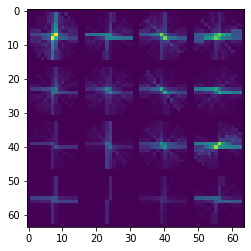

t:  68%|█████████████████████████████████████████████▎                     | 543/804 [59:27<27:01,  6.21s/it, now=None]

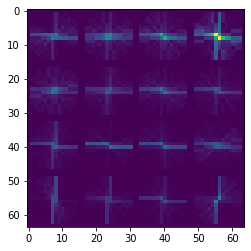

t:  68%|█████████████████████████████████████████████▌                     | 547/804 [59:52<26:16,  6.14s/it, now=None]

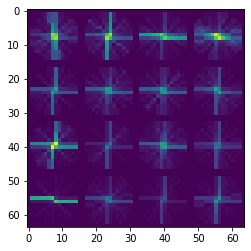

t:  71%|██████████████████████████████████████████████▍                  | 574/804 [1:02:36<23:24,  6.11s/it, now=None]

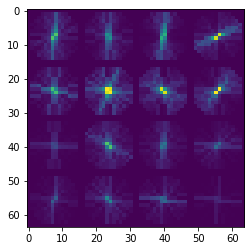

t:  72%|██████████████████████████████████████████████▌                  | 576/804 [1:02:49<23:23,  6.16s/it, now=None]

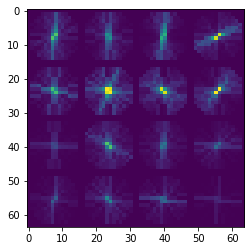

t:  72%|██████████████████████████████████████████████▉                  | 580/804 [1:03:14<23:37,  6.33s/it, now=None]

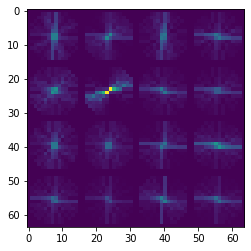

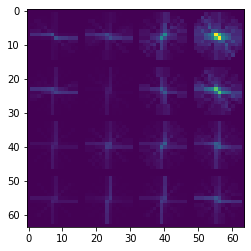

t:  72%|██████████████████████████████████████████████▉                  | 581/804 [1:03:21<23:58,  6.45s/it, now=None]

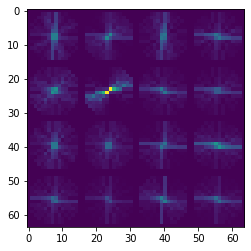

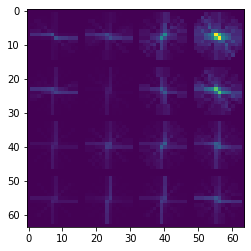

t:  72%|███████████████████████████████████████████████                  | 582/804 [1:03:28<24:03,  6.50s/it, now=None]

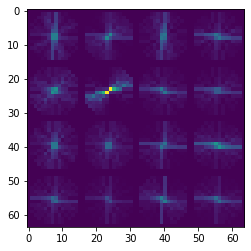

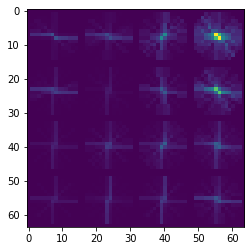

t:  73%|███████████████████████████████████████████████▏                 | 583/804 [1:03:34<24:04,  6.54s/it, now=None]

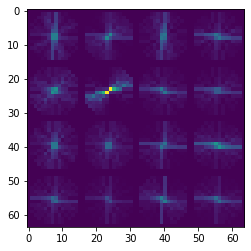

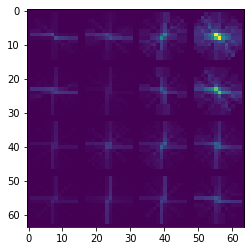

t:  73%|███████████████████████████████████████████████▋                 | 590/804 [1:04:19<22:37,  6.34s/it, now=None]

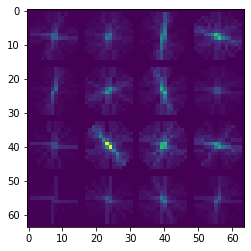

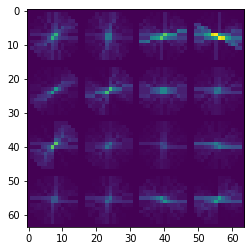

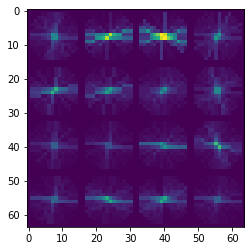

t:  74%|███████████████████████████████████████████████▊                 | 591/804 [1:04:26<22:55,  6.46s/it, now=None]

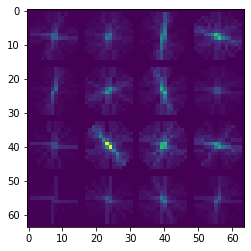

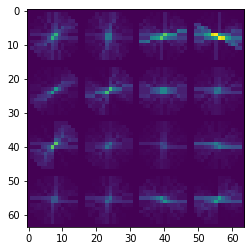

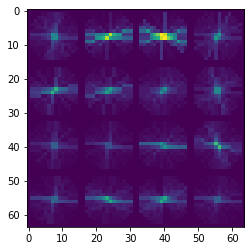

t:  74%|███████████████████████████████████████████████▊                 | 592/804 [1:04:32<23:02,  6.52s/it, now=None]

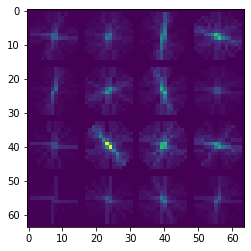

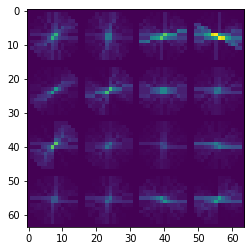

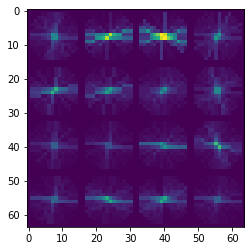

t:  74%|███████████████████████████████████████████████▉                 | 593/804 [1:04:39<23:18,  6.63s/it, now=None]

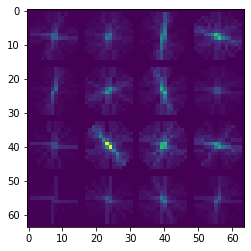

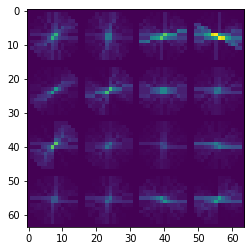

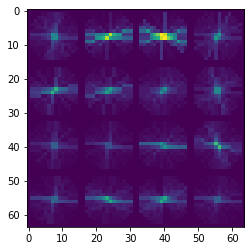

t:  74%|████████████████████████████████████████████████                 | 594/804 [1:04:46<23:17,  6.65s/it, now=None]

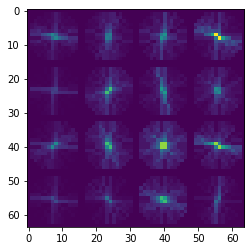

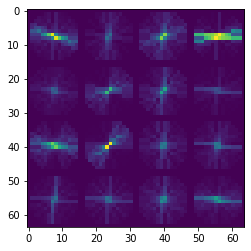

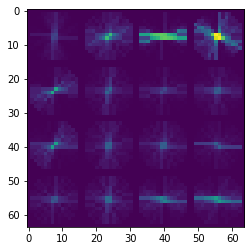

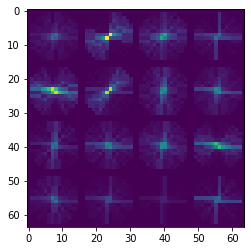

t:  74%|████████████████████████████████████████████████                 | 595/804 [1:04:53<23:23,  6.72s/it, now=None]

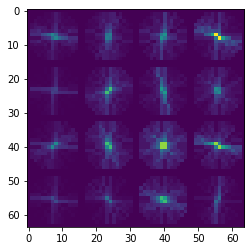

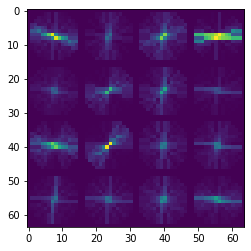

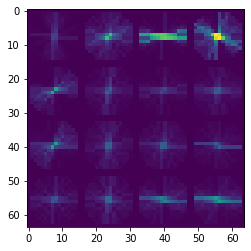

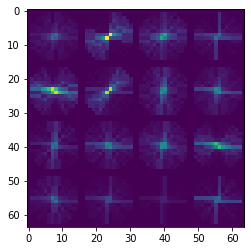

t:  74%|████████████████████████████████████████████████▏                | 596/804 [1:05:00<23:40,  6.83s/it, now=None]

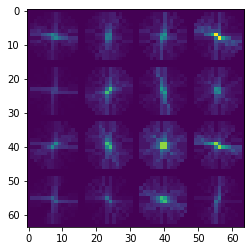

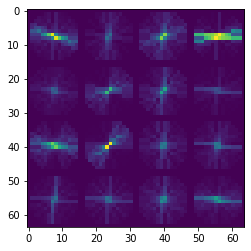

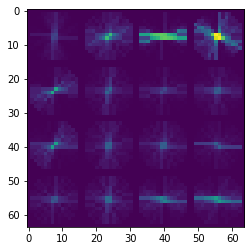

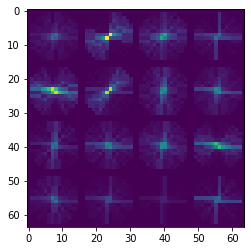

t:  74%|████████████████████████████████████████████████▎                | 597/804 [1:05:07<23:41,  6.87s/it, now=None]

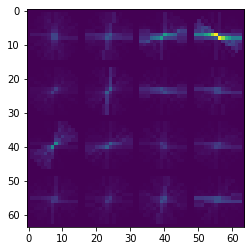

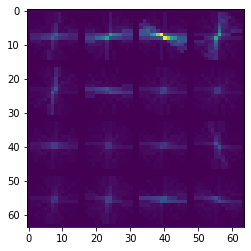

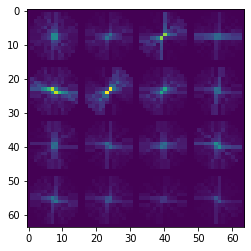

t:  74%|████████████████████████████████████████████████▎                | 598/804 [1:05:13<23:29,  6.84s/it, now=None]

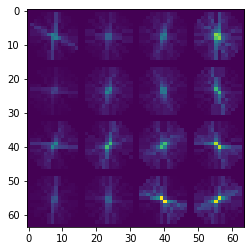

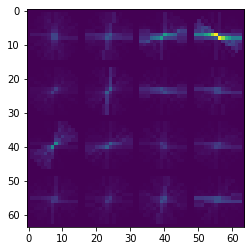

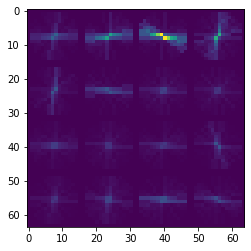

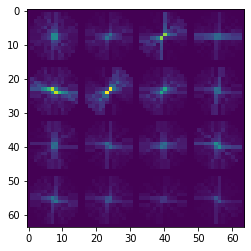

t:  75%|████████████████████████████████████████████████▍                | 599/804 [1:05:20<23:25,  6.85s/it, now=None]

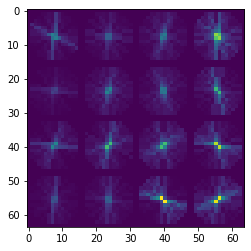

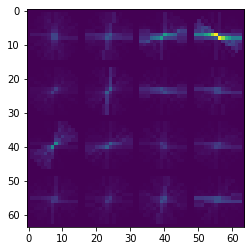

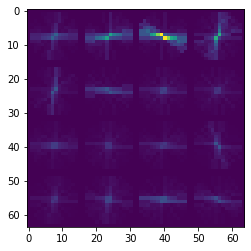

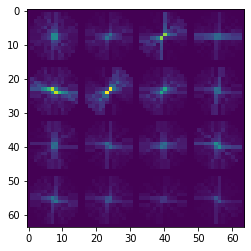

t:  75%|████████████████████████████████████████████████▌                | 600/804 [1:05:27<23:29,  6.91s/it, now=None]

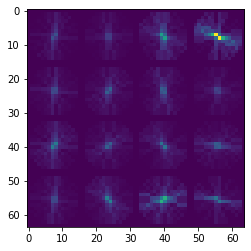

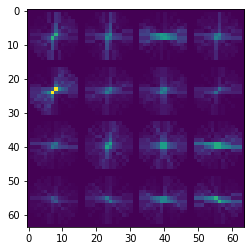

t:  75%|████████████████████████████████████████████████▌                | 601/804 [1:05:34<23:03,  6.81s/it, now=None]

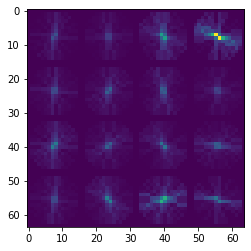

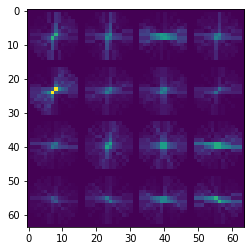

t:  75%|████████████████████████████████████████████████▋                | 602/804 [1:05:41<22:41,  6.74s/it, now=None]

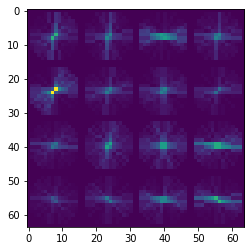

t:  75%|████████████████████████████████████████████████▊                | 603/804 [1:05:47<22:22,  6.68s/it, now=None]

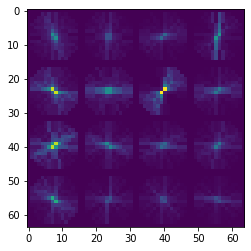

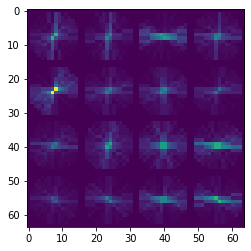

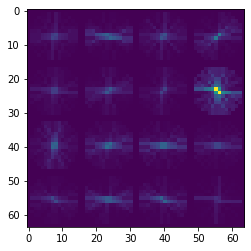

t:  75%|████████████████████████████████████████████████▊                | 604/804 [1:05:54<22:13,  6.67s/it, now=None]

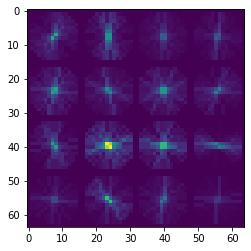

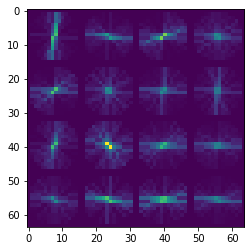

t:  75%|████████████████████████████████████████████████▉                | 605/804 [1:06:00<22:10,  6.69s/it, now=None]

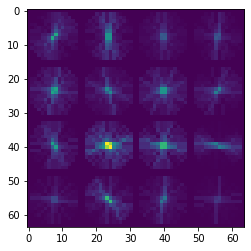

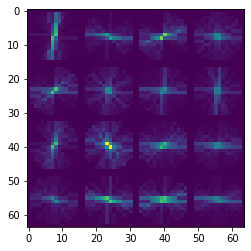

t:  75%|████████████████████████████████████████████████▉                | 606/804 [1:06:07<21:56,  6.65s/it, now=None]

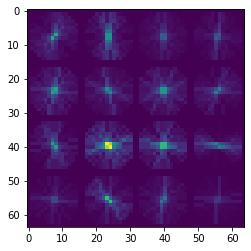

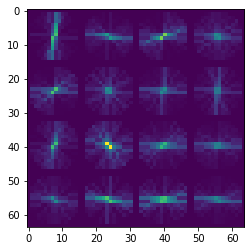

t:  75%|█████████████████████████████████████████████████                | 607/804 [1:06:14<21:43,  6.62s/it, now=None]

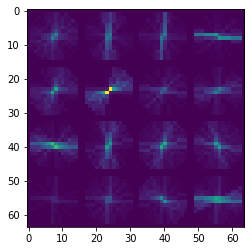

t:  76%|█████████████████████████████████████████████████▏               | 608/804 [1:06:20<21:26,  6.56s/it, now=None]

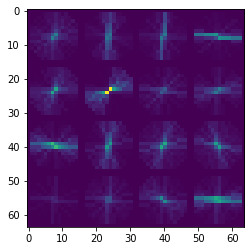

t:  76%|█████████████████████████████████████████████████▏               | 609/804 [1:06:26<21:15,  6.54s/it, now=None]

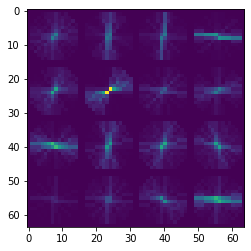

t:  76%|█████████████████████████████████████████████████▎               | 610/804 [1:06:33<21:11,  6.55s/it, now=None]

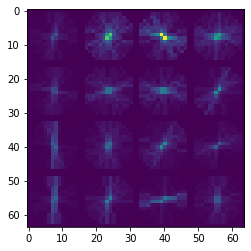

t:  76%|█████████████████████████████████████████████████▍               | 611/804 [1:06:39<20:51,  6.49s/it, now=None]

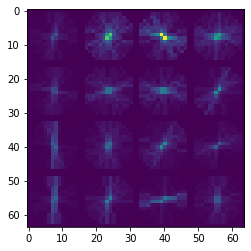

t:  76%|█████████████████████████████████████████████████▍               | 612/804 [1:06:46<20:38,  6.45s/it, now=None]

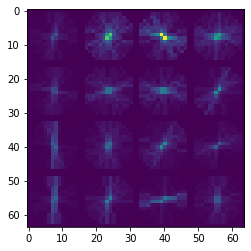

t:  76%|█████████████████████████████████████████████████▌               | 613/804 [1:06:52<20:29,  6.44s/it, now=None]

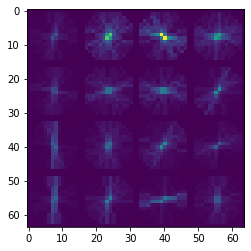

t:  78%|██████████████████████████████████████████████████▍              | 624/804 [1:08:02<18:58,  6.33s/it, now=None]

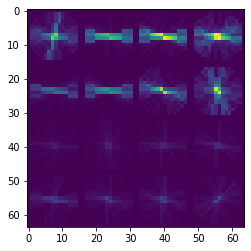

t:  78%|██████████████████████████████████████████████████▌              | 625/804 [1:08:08<19:03,  6.39s/it, now=None]

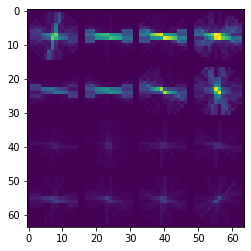

t:  78%|██████████████████████████████████████████████████▌              | 626/804 [1:08:15<18:59,  6.40s/it, now=None]

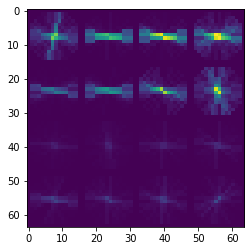

t:  78%|██████████████████████████████████████████████████▋              | 627/804 [1:08:21<18:50,  6.39s/it, now=None]

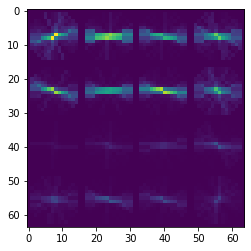

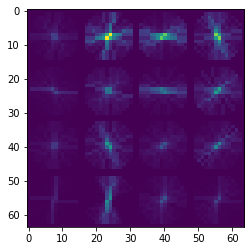

t:  78%|██████████████████████████████████████████████████▊              | 628/804 [1:08:28<18:52,  6.44s/it, now=None]

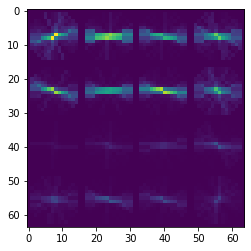

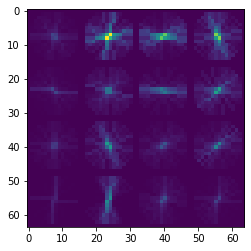

t:  78%|██████████████████████████████████████████████████▊              | 629/804 [1:08:34<18:56,  6.49s/it, now=None]

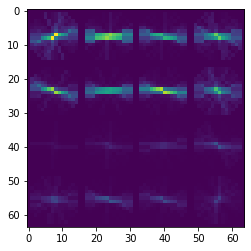

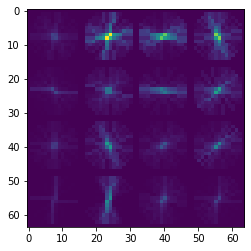

t:  78%|██████████████████████████████████████████████████▉              | 630/804 [1:08:41<18:50,  6.50s/it, now=None]

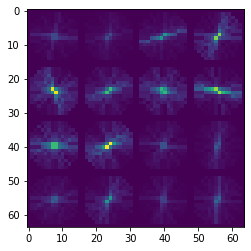

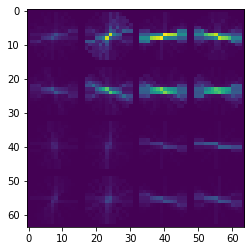

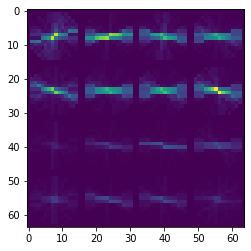

t:  78%|███████████████████████████████████████████████████              | 631/804 [1:08:47<18:50,  6.53s/it, now=None]

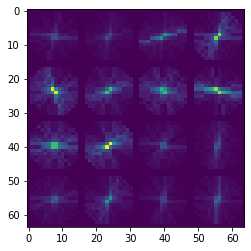

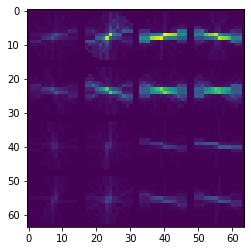

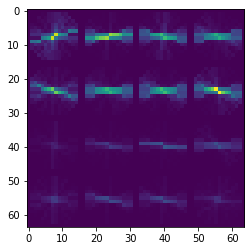

t:  79%|███████████████████████████████████████████████████              | 632/804 [1:08:54<18:49,  6.57s/it, now=None]

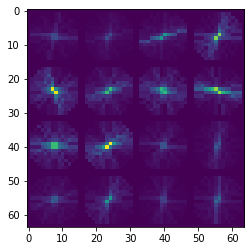

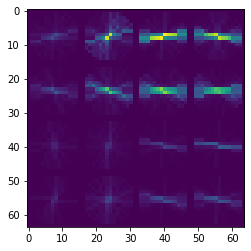

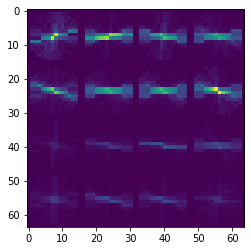

t:  79%|███████████████████████████████████████████████████▏             | 633/804 [1:09:01<18:52,  6.63s/it, now=None]

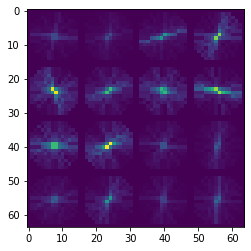

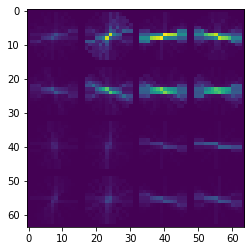

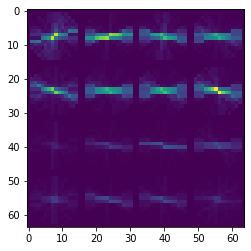

t:  79%|███████████████████████████████████████████████████▎             | 634/804 [1:09:07<18:44,  6.61s/it, now=None]

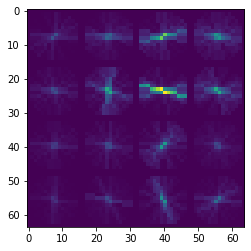

t:  79%|███████████████████████████████████████████████████▎             | 635/804 [1:09:14<18:23,  6.53s/it, now=None]

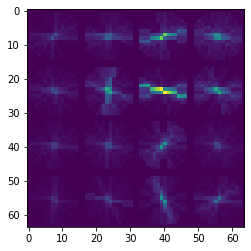

t:  79%|███████████████████████████████████████████████████▍             | 636/804 [1:09:20<18:06,  6.47s/it, now=None]

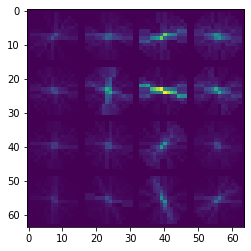

t:  79%|███████████████████████████████████████████████████▍             | 637/804 [1:09:26<17:49,  6.41s/it, now=None]

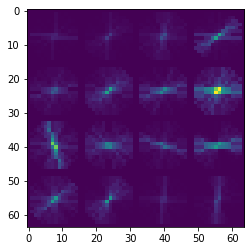

t:  79%|███████████████████████████████████████████████████▌             | 638/804 [1:09:32<17:37,  6.37s/it, now=None]

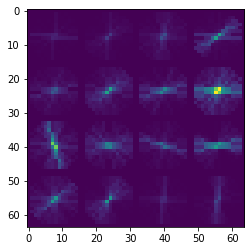

t:  79%|███████████████████████████████████████████████████▋             | 639/804 [1:09:39<17:24,  6.33s/it, now=None]

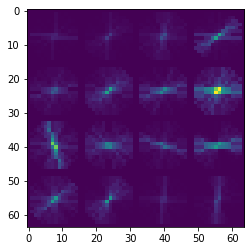

t:  80%|███████████████████████████████████████████████████▋             | 640/804 [1:09:45<17:20,  6.35s/it, now=None]

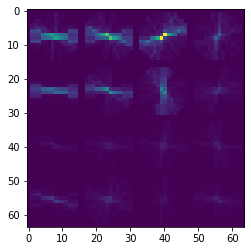

t:  80%|███████████████████████████████████████████████████▊             | 641/804 [1:09:51<17:12,  6.34s/it, now=None]

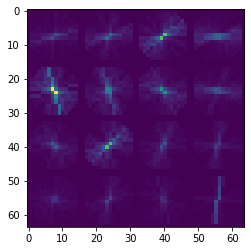

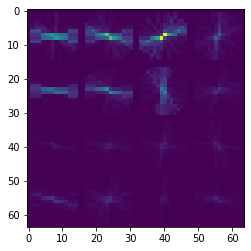

t:  80%|███████████████████████████████████████████████████▉             | 642/804 [1:09:58<17:19,  6.42s/it, now=None]

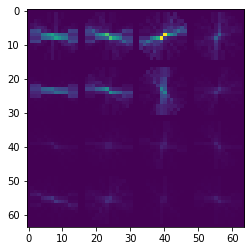

t:  80%|███████████████████████████████████████████████████▉             | 643/804 [1:10:04<17:14,  6.43s/it, now=None]

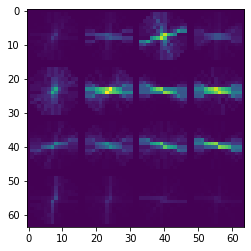

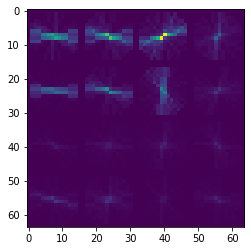

t:  80%|████████████████████████████████████████████████████             | 644/804 [1:10:11<17:13,  6.46s/it, now=None]

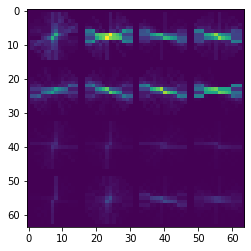

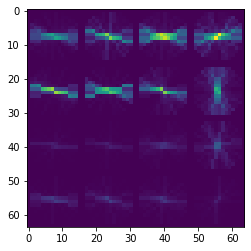

t:  80%|████████████████████████████████████████████████████▏            | 645/804 [1:10:18<17:14,  6.51s/it, now=None]

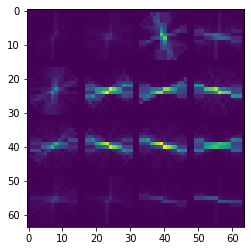

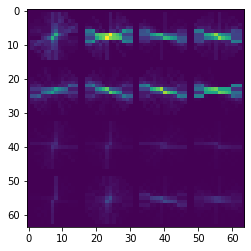

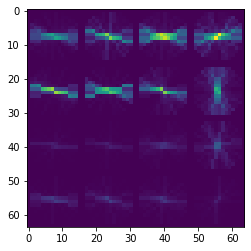

t:  80%|████████████████████████████████████████████████████▏            | 646/804 [1:10:24<17:13,  6.54s/it, now=None]

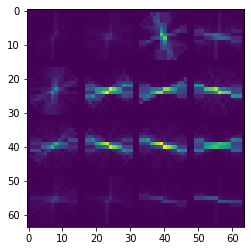

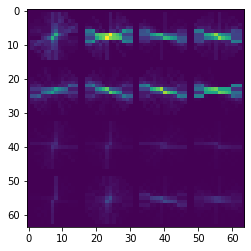

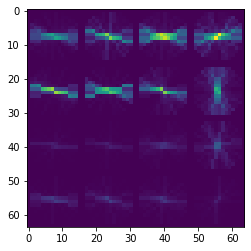

t:  80%|████████████████████████████████████████████████████▎            | 647/804 [1:10:31<17:15,  6.60s/it, now=None]

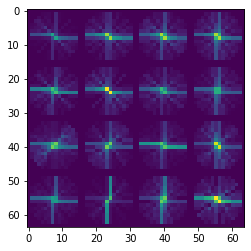

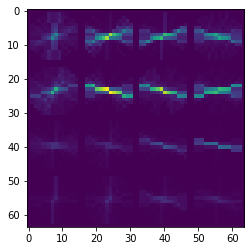

t:  81%|████████████████████████████████████████████████████▍            | 648/804 [1:10:38<17:11,  6.61s/it, now=None]

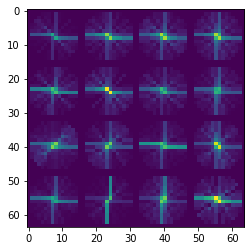

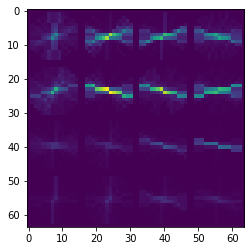

t:  81%|████████████████████████████████████████████████████▍            | 649/804 [1:10:44<17:02,  6.60s/it, now=None]

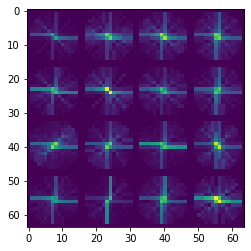

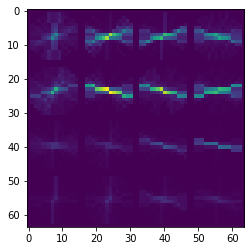

t:  81%|████████████████████████████████████████████████████▌            | 650/804 [1:10:51<16:54,  6.59s/it, now=None]

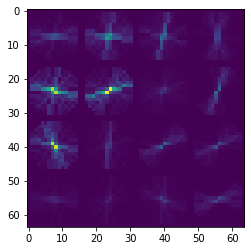

t:  81%|████████████████████████████████████████████████████▋            | 651/804 [1:10:57<16:33,  6.49s/it, now=None]

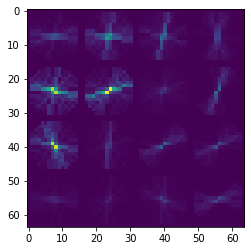

t:  81%|████████████████████████████████████████████████████▋            | 652/804 [1:11:04<16:28,  6.51s/it, now=None]

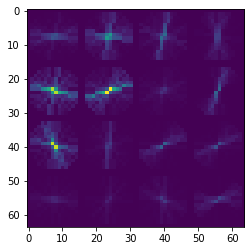

t:  81%|████████████████████████████████████████████████████▊            | 653/804 [1:11:10<16:18,  6.48s/it, now=None]

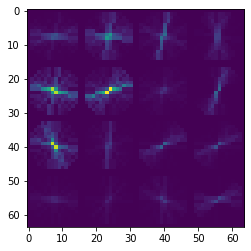

t:  81%|████████████████████████████████████████████████████▊            | 654/804 [1:11:16<16:02,  6.42s/it, now=None]

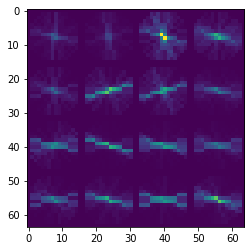

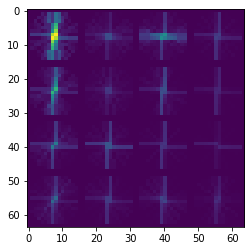

t:  81%|████████████████████████████████████████████████████▉            | 655/804 [1:11:23<16:07,  6.49s/it, now=None]

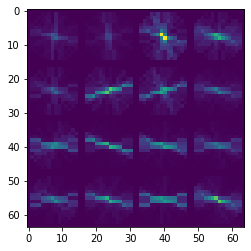

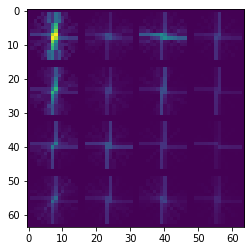

t:  82%|█████████████████████████████████████████████████████            | 656/804 [1:11:29<16:02,  6.51s/it, now=None]

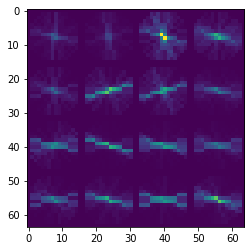

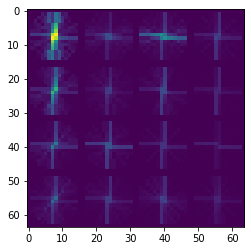

t:  82%|█████████████████████████████████████████████████████            | 657/804 [1:11:36<16:00,  6.53s/it, now=None]

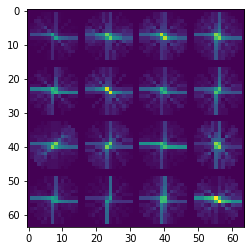

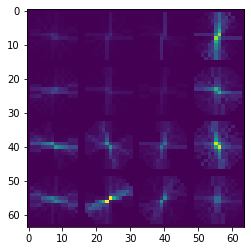

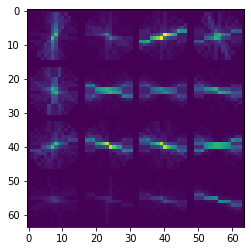

t:  82%|█████████████████████████████████████████████████████▏           | 658/804 [1:11:43<16:02,  6.60s/it, now=None]

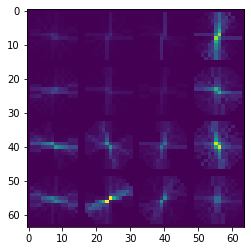

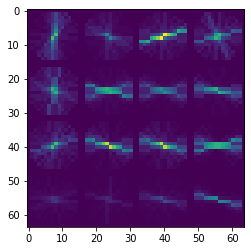

t:  82%|█████████████████████████████████████████████████████▎           | 659/804 [1:11:49<15:58,  6.61s/it, now=None]

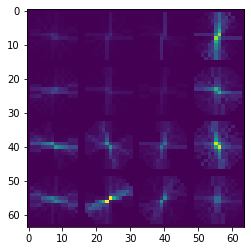

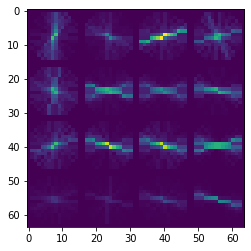

t:  82%|█████████████████████████████████████████████████████▌           | 663/804 [1:12:15<15:02,  6.40s/it, now=None]

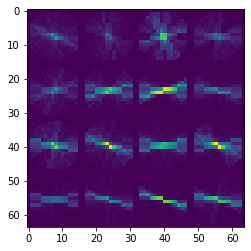

t:  83%|█████████████████████████████████████████████████████▋           | 664/804 [1:12:21<14:50,  6.36s/it, now=None]

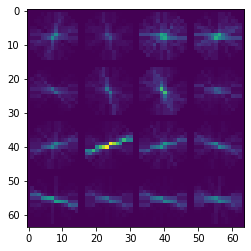

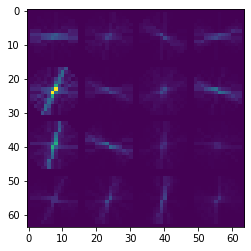

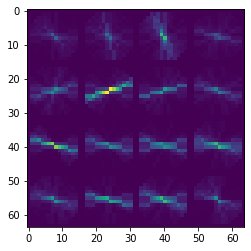

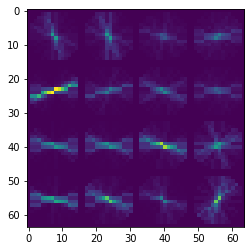

t:  83%|█████████████████████████████████████████████████████▊           | 665/804 [1:12:28<15:05,  6.51s/it, now=None]

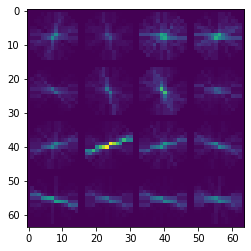

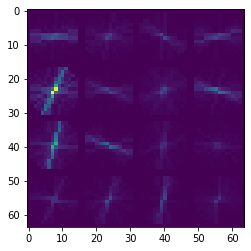

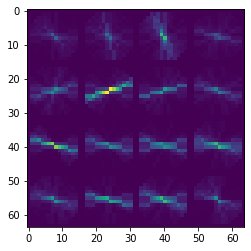

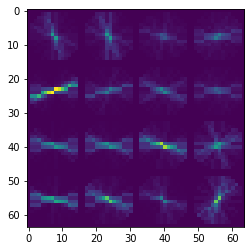

t:  83%|█████████████████████████████████████████████████████▊           | 666/804 [1:12:35<15:05,  6.56s/it, now=None]

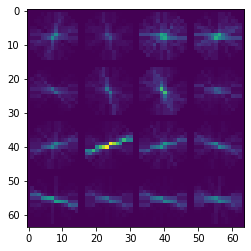

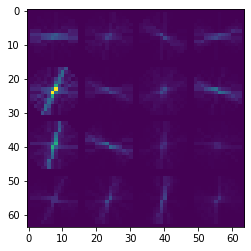

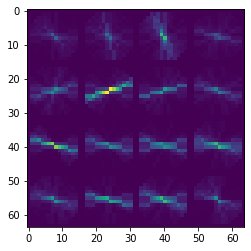

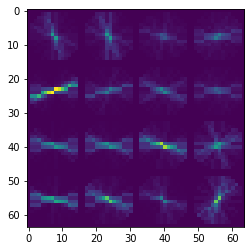

t:  83%|█████████████████████████████████████████████████████▉           | 667/804 [1:12:42<15:12,  6.66s/it, now=None]

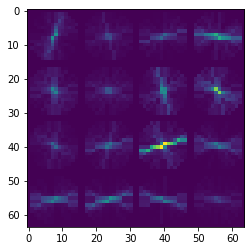

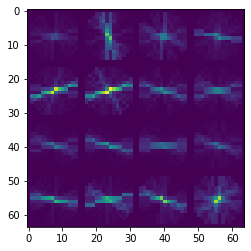

t:  83%|██████████████████████████████████████████████████████           | 668/804 [1:12:48<14:59,  6.61s/it, now=None]

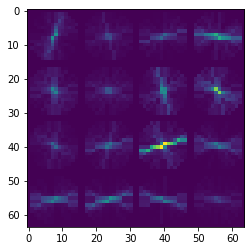

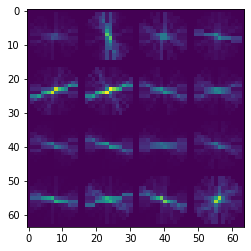

t:  83%|██████████████████████████████████████████████████████           | 669/804 [1:12:55<14:56,  6.64s/it, now=None]

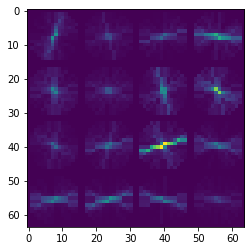

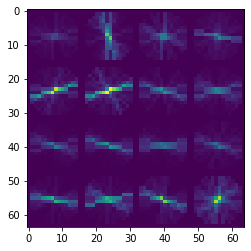

t:  84%|██████████████████████████████████████████████████████▍          | 674/804 [1:13:27<13:47,  6.36s/it, now=None]

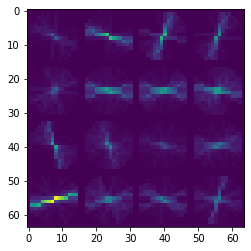

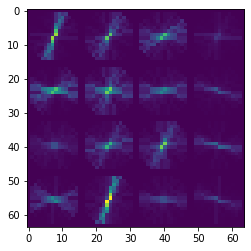

t:  84%|██████████████████████████████████████████████████████▌          | 675/804 [1:13:33<13:53,  6.46s/it, now=None]

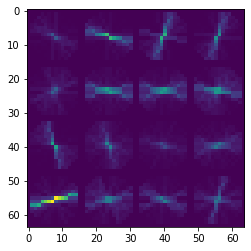

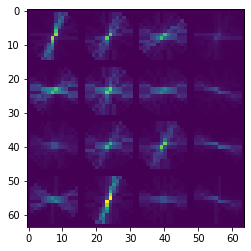

t:  84%|██████████████████████████████████████████████████████▋          | 676/804 [1:13:40<13:58,  6.55s/it, now=None]

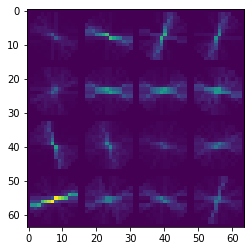

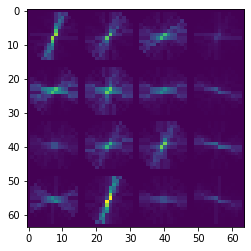

t:  84%|██████████████████████████████████████████████████████▋          | 677/804 [1:13:47<13:51,  6.55s/it, now=None]

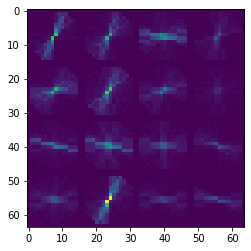

t:  85%|███████████████████████████████████████████████████████▏         | 682/804 [1:14:18<12:38,  6.22s/it, now=None]

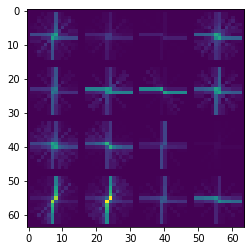

t:  91%|███████████████████████████████████████████████████████████▎     | 734/804 [1:19:38<07:12,  6.18s/it, now=None]

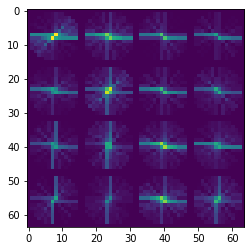

t:  91%|███████████████████████████████████████████████████████████▍     | 735/804 [1:19:45<07:09,  6.22s/it, now=None]

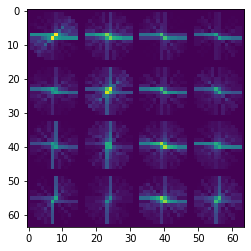

t:  92%|███████████████████████████████████████████████████████████▌     | 736/804 [1:19:51<07:08,  6.31s/it, now=None]

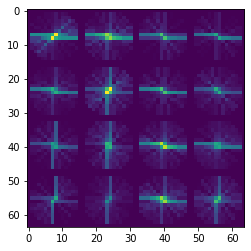

t:  93%|████████████████████████████████████████████████████████████▍    | 747/804 [1:20:59<05:54,  6.22s/it, now=None]

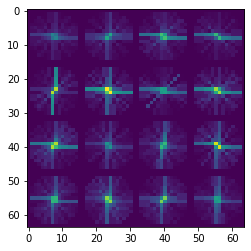

t:  93%|████████████████████████████████████████████████████████████▍    | 748/804 [1:21:06<05:50,  6.25s/it, now=None]

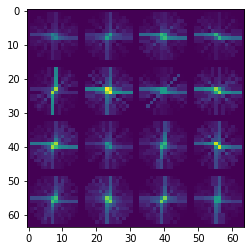

t:  93%|████████████████████████████████████████████████████████████▌    | 749/804 [1:21:12<05:44,  6.26s/it, now=None]

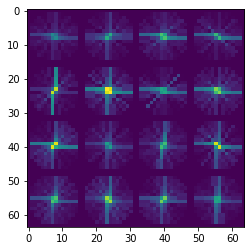

t:  93%|████████████████████████████████████████████████████████████▋    | 750/804 [1:21:18<05:39,  6.30s/it, now=None]

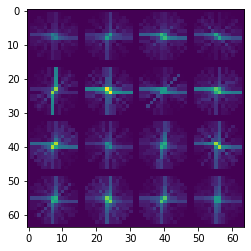

Moviepy - Done !
Moviepy - video ready E:/Project/result_videos/outputfinal.mp4
Wall time: 1h 27min


In [30]:
count=0
hot_window=Hot_window(30)
video_output = 'E:/Project/result_videos/outputfinal.mp4'
clip1 = VideoFileClip("E:/Project/video1.mp4")
video_clip = clip1.fl_image(pipeline)
%time video_clip.write_videofile(video_output, audio=False)